# Modelando la Pandemia

  En este proyecto vamos a estudiar y analizar los datos mundiales de la pandemia COVID-19 usando países modelo de distintas políticas públicas para luego interpretar otras curvas.

Puedes descargar el dataset de casos totales, divididos por país [aquí.](
https://ourworldindata.org/coronavirus-data?country=
) Descarga los datos  formato .csv luego podrás cargarlos en el notebook usando pandas, a partir de eso selecciona los de los países que te interesan, hay un ejemplo de cómo se hace esto en este notebook. 

# ¿Cómo empezó la pandemia?


  La primer parte del trabajo consiste en estudiar cómo se empieza a propagar la pandemia, luego analizaremos las medidas tomadas y su efectividad.

  Al inicio de una pandemia, se estima que los contagios siguen una ley exponencial, esa es la fase de "crecimiento exponencial", luego hay un decaimiento dado por la inmunidad. 

  Los datos de casos confirmados en función del tiempo $C(t)$, pueden aproximarse con el modelo

$C(t)=e^{k(t-t_0)}$

donde $t_0$ es la fecha del primer contagio, y $k$ es un parámetro propio de cada enfermedad, que habla de la contagiosidad. Cuanto mayor es $k$, más grande será el número de casos confirmados dado por la expresión. $k$ depende de el tiempo que una persona enferma contagia, el nivel de infecciosidad del virus y cuántas personas que se pueden contagiar ve una persona enferma por día. Es decir, la circulación. Haciendo cuarententa, $k$ disminuye, con la circulación $k$ aumenta.

  El parámetro $k$ está directamente relacionado con el $R$ del que tanto se habla en los medios. En este proyecto haremos foco en $k$, pero puedes profundizar sobre esto si quieres, empezandó por [aquí](https://es.wikipedia.org/wiki/Ritmo_reproductivo_b%C3%A1sico). 

  Es posible hacer un modelo completo, pero para eso es necesario utilizar ecuaciones diferenciales. Si quieres profundizar sobre eso, busca información sobre "modelo epidemiológico SEIR". Si quieres ver cómo funciona este modelo, puedes empezar por [aquí](http://gabgoh.github.io/COVID/index.html). En ese link está implementado el modelo SEIR (no es necesario entender las ecuaciones en este caso) y el rol que cumplen los parámetros, puedes explorar el impacto de variar $R$ y el resto de los valores para ver cómo impactan en la cirva de contagios. Ahora utilizaremos la siguiente expresión para describir únicamente la etapa de crecimiento exponencial.


  Comienza estudiando cómo se distribuyó el $k$ inicial de la pandemia y si es posible elaborar un intervalo de confianza razonable para este valor. Para eso 
  
  1. Elegir diez países del norte (ahí empezó la pandemia) y puedes mide el valor de $k$ inicial de la pandemia, analizando datos del primer tramo.

  2. Analiza si es posible estimar la evolución mundial de la pandemia a partir de lo que obtuviste. Para esto, puedes elaborar un intervalo de confianza para $k$ a partir de los que obtuviste y así generar un modelo nuevo, basado en la distribución de $k$. Luego compara el modelo con los datos mundiales.

3. Piensa qué significa que el modelo de "bien" o dé "mal" ¿qué indicadores de esto existen?. Luego discute en el informe por qué crees que dio así. Recuerda que es importante elegir bien la población de muestra. Piensa qué criterios puedes elegir para representar bien la población mundial que se contagió al inicio de la pandemia.
 
 # Evaluando estrategias

 Ahora que tienes una manera de obtener información de las curvas, puedes intentar evaluar las estrategias de acción y el comportamiento de las poblaciones, construyendo un clasificador binario. 
1. Elige una categoría binaria que hable de políticas públicas elegidas por los países para enfrentar la pandemia que te interese estudiar, como pueden ser "la población hizo cuarententa" o "la población se vacunó".
2. Piensa qué indicadores de la curva pueden hablar del éxito de la política que quieres estudiar. Por ejemplo, si se tratase de evaluar el éxito de una cuarentena podría ser porcentaje de población  que se contagió o variación del valor de $k$ a partir de que se empezó a implementar esa medida. Elige al menos 3 indicadores.
3. Investiga sobre países que hayan aplicado o no esa política pública, para generar una base de datos. Por ejemplo, Brasil no hizo cuarentena y China hizo una muy estricta. Recuerda hacer una selección inteligente de la porción de datos de la curva de cada país que vas a analizar.
4. Construye un clasificador binario a partir de una regresión logística o usando Naive Bayes para intentar analizar la estrategia de otros países y ver si es posible predecirla a partir de la curva de contagios y el clasificador. Un posible clasificador binario es uno que clasifique el porcentaje de contagios en función da las categorías "la población hizo cuarentena" y "la población n hizo cuarentena". Haz esto para los 3 indicadores que elegiste en el punto 3 y compara los resultados.
5. Elabora un informe con lo que hayas aprendido a lo largo de este proyecto, donde discutas la utilidad o no de los indicadores que elegiste y del análisis estadístico propuesto.

#¡Comencemos!

  A continuación dejamos un ejemplo de cómo extraer el $k$ inicial de Argentina, usando un ajuste de cuadrados mínimos. Si necesitas los datos mundiales, en la columna de países aparecen como "World".



In [1]:
# https://stackoverflow.com/questions/21971449/how-do-i-increase-the-cell-width-of-the-jupyter-ipython-notebook-in-my-browser
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

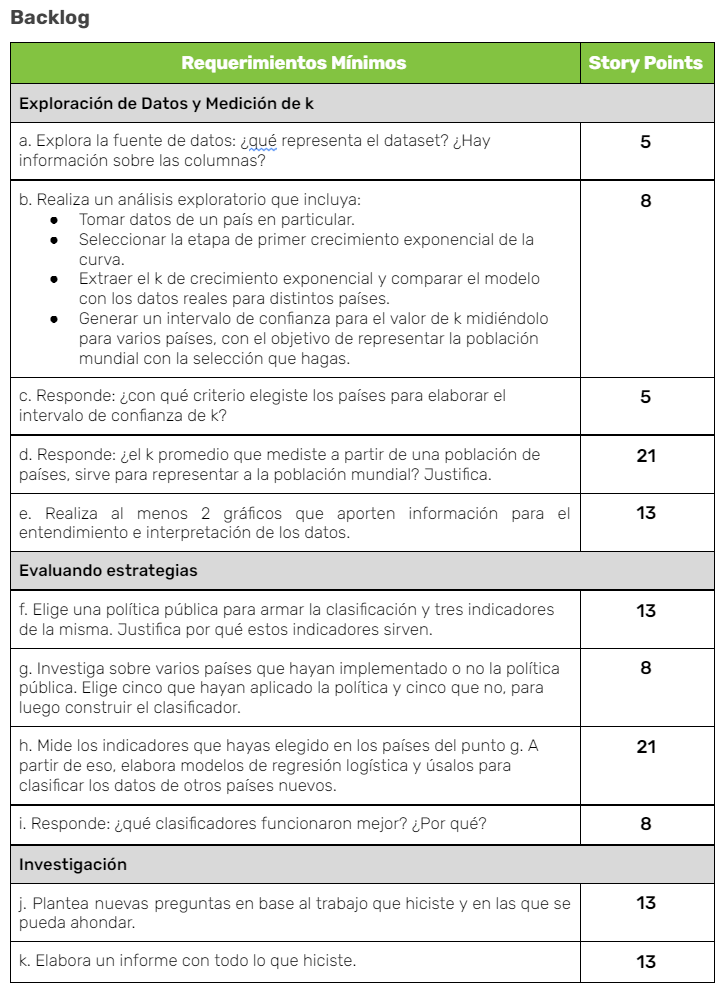

In [2]:
import numpy as np
import pandas as pd
import pylab as plt
from scipy.optimize import curve_fit

In [3]:
#cargamos los datos

#drive.mount('/content/gdrive', force_remount=True)

# Aca deben apuntar a la carpeta de su drive donde guardaron los datos
#root_dir = "/content/gdrive/My Drive/datos_acamica"


In [4]:
data=pd.read_csv('C:/Users/pulzara/Documents/digital house/spring 4/dataset spring 4/dataset/covid data.csv')
data

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126451,ZWE,Africa,Zimbabwe,2021-10-22,132588.0,48.0,43.286,4663.0,1.0,1.143,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
126452,ZWE,Africa,Zimbabwe,2021-10-23,132588.0,0.0,36.429,4663.0,0.0,0.857,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
126453,ZWE,Africa,Zimbabwe,2021-10-24,132651.0,63.0,40.429,4669.0,6.0,1.571,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
126454,ZWE,Africa,Zimbabwe,2021-10-25,132688.0,37.0,45.714,4673.0,4.0,2.143,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN


In [281]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 126456 entries, 0 to 126455
Data columns (total 68 columns):
 #   Column                                   Non-Null Count   Dtype  
---  ------                                   --------------   -----  
 0   iso_code                                 126456 non-null  object 
 1   continent                                120734 non-null  object 
 2   location                                 126456 non-null  object 
 3   date                                     126456 non-null  object 
 4   total_cases                              119558 non-null  float64
 5   new_cases                                119554 non-null  float64
 6   new_cases_smoothed                       118540 non-null  float64
 7   total_deaths                             108608 non-null  float64
 8   new_deaths                               108761 non-null  float64
 9   new_deaths_smoothed                      118540 non-null  float64
 10  total_cases_per_million         

In [6]:
data.shape

(126456, 65)

In [7]:
data.icu_patients.isnull().sum()

111033

In [8]:
data.icu_patients_per_million.isnull().sum() 

111033

In [9]:
paises=data['location'] #cargo el vector de paises
confirmados=data['total_cases'] #carga vector todos los casos confirmados

Text(0, 0.5, 'cantidad de casos')

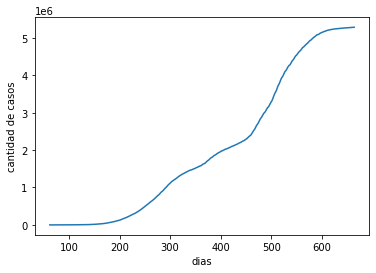

In [10]:
#seleccionamos Argentina

ind_arg=np.where(paises=='Argentina')
ind_arg=ind_arg[0]
casos_arg=confirmados[ind_arg]
dias=np.arange(0,len(casos_arg))
plt.plot(dias,casos_arg)
plt.xlabel('dias')
plt.ylabel('cantidad de casos')

Esta es la curva de **casos totales** de la Argentina. Aquí no se ven las olas, ya que estas se ven en la curva de casos confirmados por día, es decir, de casos nuevos. Esta habla de los acumulados, entonces siempre se agregan.

Para ver mejor la curva, podemos tomar el logartimo de los datos. Una curva exponencial se ve lineal en escala logarítmica


Text(0, 0.5, 'log cantidad de casos')

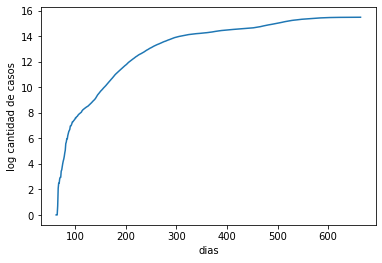

In [11]:
plt.plot(dias,np.log(casos_arg))
plt.xlabel('dias')
plt.ylabel('log cantidad de casos')

Veamos lo que pasa en los primeros 60 días desde que se detectó el primer caso en Argentina, para ver cómo fue el $k$ inicial

Text(0, 0.5, 'cantidad de casos')

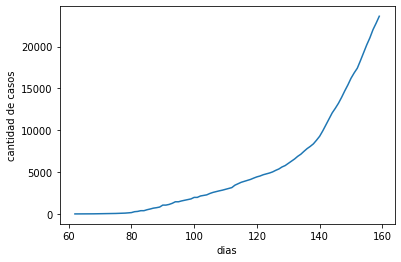

In [12]:
casos_principio=casos_arg[0:160]
dias_principio=dias[0:160]

plt.plot(dias_principio,casos_principio)
plt.xlabel('dias')
plt.ylabel('cantidad de casos')

Es difícil determinar si esta parte es exponencial. Analicemos qué pasa en escala logarítmica.

Text(0, 0.5, 'log cantidad de casos')

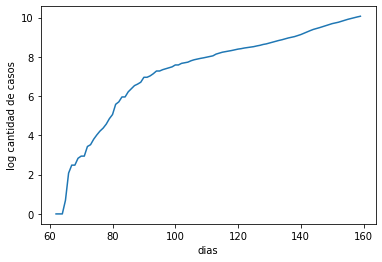

In [13]:

plt.plot(dias_principio,np.log(casos_principio))
plt.xlabel('dias')
plt.ylabel('log cantidad de casos')

Mejor nos quedamos con lo que sucede entre los días 31 y 55, ya que ese fue el comportamiento más sostenido.

Text(0, 0.5, 'cantidad de casos')

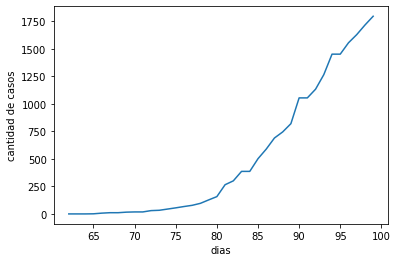

In [14]:
casos_principio=casos_arg[60:100]
dias_principio=dias[60:100]

plt.plot(dias_principio,casos_principio)
plt.xlabel('dias')
plt.ylabel('cantidad de casos')

Text(0, 0.5, 'log cantidad de casos')

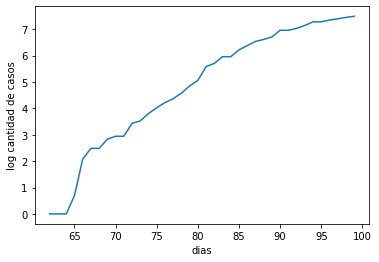

In [15]:
plt.plot(dias_principio,np.log(casos_principio))
plt.xlabel('dias')
plt.ylabel('log cantidad de casos')

¡Se ve bastante lineal! Aprovechemos esto para averiguar el $k$ utilizando un ajuste hecho con el método de cuadrados mínimos, ajustando los datos al modelo 

$Confirmados=e^{k(t-t_0)}$



In [16]:
data.head(3)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN


In [17]:
arg = data[data['location'] == 'Argentina']
arg = arg.reset_index(drop=True)
arg.head(3)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,ARG,South America,Argentina,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,16.2,27.7,NaN,5.0,76.67,0.845,NaN,NaN,NaN,NaN
1,ARG,South America,Argentina,2020-01-02,NaN,NaN,NaN,NaN,NaN,NaN,...,16.2,27.7,NaN,5.0,76.67,0.845,NaN,NaN,NaN,NaN
2,ARG,South America,Argentina,2020-01-03,NaN,NaN,NaN,NaN,NaN,NaN,...,16.2,27.7,NaN,5.0,76.67,0.845,NaN,NaN,NaN,NaN


In [18]:
arg = arg[['location','date','total_cases']].dropna()

In [19]:
casos_principio = arg.total_cases[10:45]
dias_principio = np.arange(0,len(casos_principio))

In [20]:
#definimos función para ajustar modelo
def exponencial(t,k,t0):
  C=np.exp(k*(t-t0))
  return C

In [21]:
#ajustamos
popt_arg, pcov_arg = curve_fit(exponencial, dias_principio, casos_principio)
popt_arg #valor de k

array([  0.07521593, -71.69874519])

In [157]:
pcov_arg

array([[1.55101765e-05, 2.05636352e-02],
       [2.05636352e-02, 2.73669738e+01]])

Veamos cómo se ajusta lo que obtuvimos a los datos reales

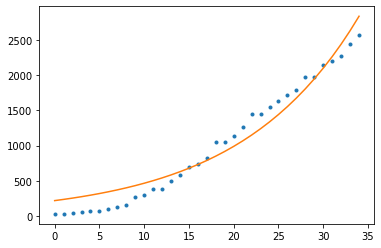

In [158]:
k=popt_arg[0]
t0=popt_arg[1]
casos_simu=exponencial(dias_principio,k,t0)
plt.plot(dias_principio,casos_principio,'.')
plt.plot(dias_principio,casos_simu)

Como última pista, hagamos una función que determine los casos nuevos por día a partir de estas curvas.

In [159]:
def casos_nuevos(casos):
  nuevos=np.zeros(len(casos))
  i=0
  while i<len(nuevos)-1:
    nuevos[i]=casos[i+1]-casos[i]
    i=i+1

  return nuevos   

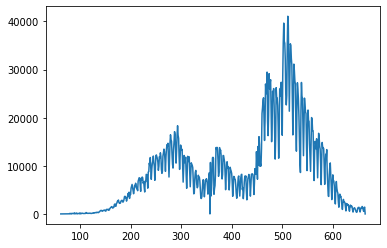

In [160]:
casos_arg=np.array(casos_arg)
nuevos_arg=casos_nuevos(casos_arg)
plt.plot(nuevos_arg)

# paises del norte

## Germany

In [162]:
germany = data[data['location'] == 'Germany']
germany = germany.reset_index(drop=True)
germany.head(3)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,DEU,Europe,Germany,2020-01-27,1.0,1.0,NaN,NaN,NaN,NaN,...,28.2,33.1,NaN,8.0,81.33,0.947,NaN,NaN,NaN,NaN
1,DEU,Europe,Germany,2020-01-28,4.0,3.0,NaN,NaN,NaN,NaN,...,28.2,33.1,NaN,8.0,81.33,0.947,NaN,NaN,NaN,NaN
2,DEU,Europe,Germany,2020-01-29,4.0,0.0,NaN,NaN,NaN,NaN,...,28.2,33.1,NaN,8.0,81.33,0.947,NaN,NaN,NaN,NaN


In [163]:
germany = germany[['location','date','total_cases']].dropna()

In [164]:
casos_principio = germany.total_cases[25:35]
dias_principio = np.arange(0,len(casos_principio))

In [165]:
#ajustamos
popt_ger, pcov_ger = curve_fit(exponencial, dias_principio, casos_principio)
popt_ger #valor de k

array([ 0.36780444, -4.08619156])

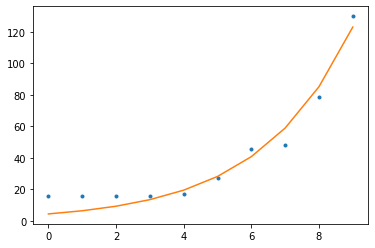

In [166]:
k=popt_ger[0]
t0=popt_ger[1]
casos_simu=exponencial(dias_principio,k,t0)
plt.plot(dias_principio,casos_principio,'.')
plt.plot(dias_principio,casos_simu)

hagamos una función que determine los casos nuevos por día a partir de estas curvas. Puede ser útil para tu análisis.

Text(0, 0.5, 'cantidad de casos')

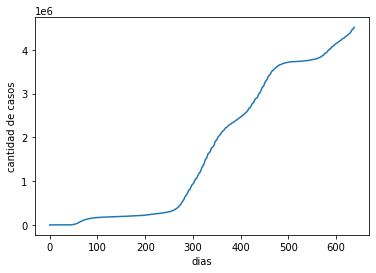

In [167]:
#seleccionamos germany

ind_germany=np.where(paises=='Germany')
ind_germany=ind_germany[0]
casos_germany=confirmados[ind_germany]
dias=np.arange(0,len(casos_germany))
plt.plot(dias,casos_germany)
plt.xlabel('dias')
plt.ylabel('cantidad de casos')

**Casos nuevos por dia**

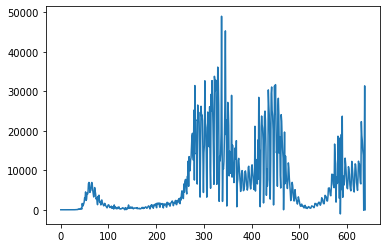

In [168]:
casos_germany=np.array(casos_germany)
nuevos_germany=casos_nuevos(casos_germany)
plt.plot(nuevos_germany)

## Austria

In [169]:
austria = data[data['location'] == 'Austria']
austria = austria.reset_index(drop=True)
austria.head(3)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AUT,Europe,Austria,2020-02-25,2.0,2.0,NaN,NaN,NaN,NaN,...,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN,NaN,NaN
1,AUT,Europe,Austria,2020-02-26,2.0,0.0,NaN,NaN,NaN,NaN,...,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN,NaN,NaN
2,AUT,Europe,Austria,2020-02-27,3.0,1.0,NaN,NaN,NaN,NaN,...,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN,NaN,NaN


In [170]:
austria = austria[['location','date','total_cases']].dropna()

In [302]:
casos_principio = austria.total_cases[10:25]
dias_principio = np.arange(0,len(casos_principio))

In [304]:
casos_principio 

10      55.0
11      79.0
12     104.0
13     131.0
14     182.0
15     246.0
16     302.0
17     504.0
18     655.0
19     860.0
20    1018.0
21    1332.0
22    1646.0
23    2013.0
24    2388.0
Name: total_cases, dtype: float64

In [172]:
#ajustamos
popt_aus, pcov_aus = curve_fit(exponencial, dias_principio, casos_principio)
popt_aus #valor de k

array([  0.22961085, -20.06278308])

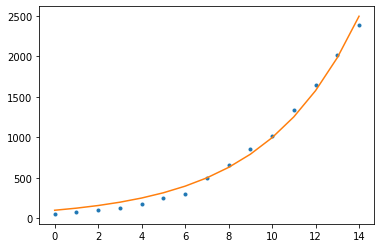

In [173]:
k=popt_aus[0]
t0=popt_aus[1]
casos_simu=exponencial(dias_principio,k,t0)
plt.plot(dias_principio,casos_principio,'.')
plt.plot(dias_principio,casos_simu)

Text(0, 0.5, 'cantidad de casos')

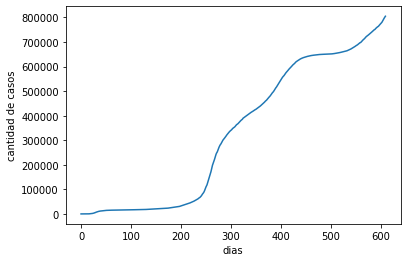

In [174]:

ind_austria=np.where(paises=='Austria')
ind_austria=ind_austria[0]
casos_austria=confirmados[ind_austria]
dias=np.arange(0,len(casos_austria))
plt.plot(dias,casos_austria)
plt.xlabel('dias')
plt.ylabel('cantidad de casos')

**Casos nuevos por dia**

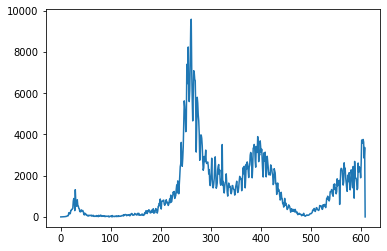

In [175]:
casos_austria=np.array(casos_austria)
nuevos_austria=casos_nuevos(casos_austria)
plt.plot(nuevos_austria)

## Canada

In [176]:
canada = data[data['location'] == 'Canada']
canada = canada.reset_index(drop=True)
canada.head(3)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,CAN,North America,Canada,2020-01-26,1.0,1.0,NaN,NaN,NaN,NaN,...,12.0,16.6,NaN,2.5,82.43,0.929,-590.3,-2.32,-2.05,-15.506498
1,CAN,North America,Canada,2020-01-27,1.0,0.0,NaN,NaN,NaN,NaN,...,12.0,16.6,NaN,2.5,82.43,0.929,NaN,NaN,NaN,NaN
2,CAN,North America,Canada,2020-01-28,2.0,1.0,NaN,NaN,NaN,NaN,...,12.0,16.6,NaN,2.5,82.43,0.929,NaN,NaN,NaN,NaN


In [177]:
canada = canada[['location','date','total_cases']].dropna()

In [178]:
casos_principio = canada.total_cases[20:35]
dias_principio = np.arange(0,len(casos_principio))

In [179]:
#ajustamos
popt_can, pcov_can = curve_fit(exponencial, dias_principio, casos_principio)
popt_can #valor de k

array([  0.08068616, -21.28827134])

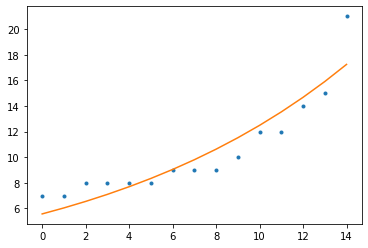

In [180]:
k=popt_can[0]
t0=popt_can[1]
casos_simu=exponencial(dias_principio,k,t0)
plt.plot(dias_principio,casos_principio,'.')
plt.plot(dias_principio,casos_simu)

Text(0, 0.5, 'cantidad de casos')

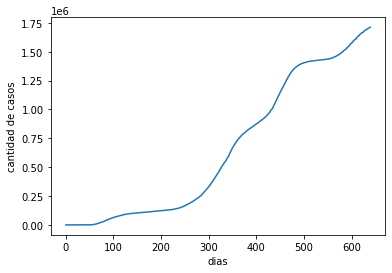

In [181]:
ind_canada=np.where(paises=='Canada')
ind_canada=ind_canada[0]
casos_canada=confirmados[ind_canada]
dias=np.arange(0,len(casos_canada))
plt.plot(dias,casos_canada)
plt.xlabel('dias')
plt.ylabel('cantidad de casos')

**Casos nuevos por dia**

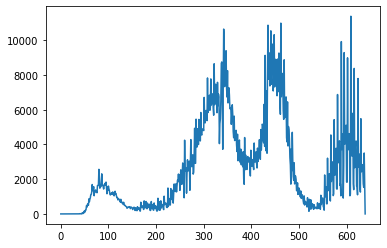

In [182]:
casos_canada=np.array(casos_canada)
nuevos_canada=casos_nuevos(casos_canada)
plt.plot(nuevos_canada)

## Colombia

In [183]:
colombia = data[data['location'] == 'Colombia']
colombia = colombia.reset_index(drop=True)
colombia.head(3)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,COL,South America,Colombia,2020-03-06,1.0,1.0,NaN,NaN,NaN,NaN,...,4.7,13.5,65.386,1.71,77.29,0.767,NaN,NaN,NaN,NaN
1,COL,South America,Colombia,2020-03-07,1.0,0.0,NaN,NaN,NaN,NaN,...,4.7,13.5,65.386,1.71,77.29,0.767,NaN,NaN,NaN,NaN
2,COL,South America,Colombia,2020-03-08,1.0,0.0,NaN,NaN,NaN,NaN,...,4.7,13.5,65.386,1.71,77.29,0.767,-319.6,-0.67,-2.95,-6.234171


In [184]:
colombia = colombia[['location','date','total_cases']].dropna()

In [185]:
casos_principio = colombia.total_cases[15:35]
dias_principio = np.arange(0,len(casos_principio))

In [186]:
#ajustamos
popt_col, pcov_col = curve_fit(exponencial, dias_principio, casos_principio)
popt_col #valor de k

array([  0.10675745, -53.37995092])

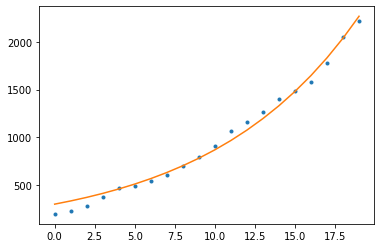

In [187]:
k=popt_col[0]
t0=popt_col[1]
casos_simu=exponencial(dias_principio,k,t0)
plt.plot(dias_principio,casos_principio,'.')
plt.plot(dias_principio,casos_simu)

Text(0, 0.5, 'cantidad de casos')

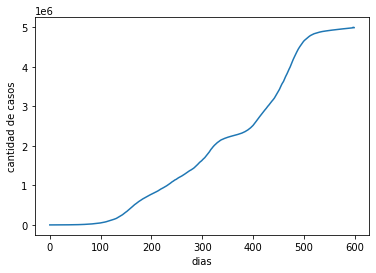

In [188]:
ind_colombia=np.where(paises=='Colombia')
ind_colombia=ind_colombia[0]
casos_colombia=confirmados[ind_colombia]
dias=np.arange(0,len(casos_colombia))
plt.plot(dias,casos_colombia)
plt.xlabel('dias')
plt.ylabel('cantidad de casos')

**Casos nuevos por dia**

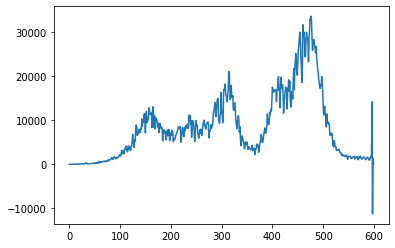

In [189]:
casos_colombia=np.array(casos_colombia)
nuevos_colombia=casos_nuevos(casos_colombia)
plt.plot(nuevos_colombia)

## España

In [190]:
spain = data[data['location'] == 'Spain']
spain = spain.reset_index(drop=True)
spain.head(3)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,ESP,Europe,Spain,2020-02-01,1.0,1.0,NaN,NaN,NaN,NaN,...,27.4,31.4,NaN,2.97,83.56,0.904,NaN,NaN,NaN,NaN
1,ESP,Europe,Spain,2020-02-02,1.0,0.0,NaN,NaN,NaN,NaN,...,27.4,31.4,NaN,2.97,83.56,0.904,-3085.8,-6.05,-0.9,-66.013179
2,ESP,Europe,Spain,2020-02-03,1.0,0.0,NaN,NaN,NaN,NaN,...,27.4,31.4,NaN,2.97,83.56,0.904,NaN,NaN,NaN,NaN


In [191]:
spain = spain[['location','date','total_cases']].dropna()

In [192]:
casos_principio = spain.total_cases[25:35]
dias_principio = np.arange(0,len(casos_principio))

In [193]:
#ajustamos
popt_spain, pcov_spain = curve_fit(exponencial, dias_principio, casos_principio)
popt_spain #valor de k

array([ 0.32176204, -9.57390255])

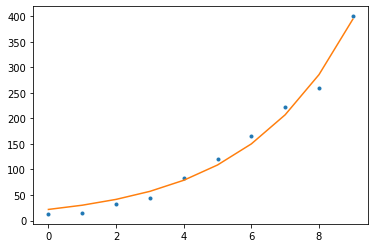

In [194]:
k=popt_spain[0]
t0=popt_spain[1]
casos_simu=exponencial(dias_principio,k,t0)
plt.plot(dias_principio,casos_principio,'.')
plt.plot(dias_principio,casos_simu)

Text(0, 0.5, 'cantidad de casos')

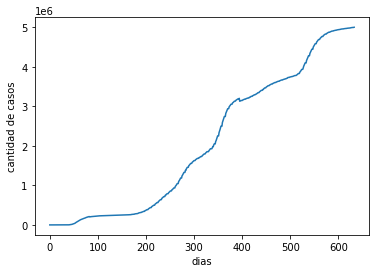

In [195]:
ind_spain=np.where(paises=='Spain')
ind_spain=ind_spain[0]
casos_spain=confirmados[ind_spain]
dias=np.arange(0,len(casos_spain))
plt.plot(dias,casos_spain)
plt.xlabel('dias')
plt.ylabel('cantidad de casos')

**Casos nuevos por dia**

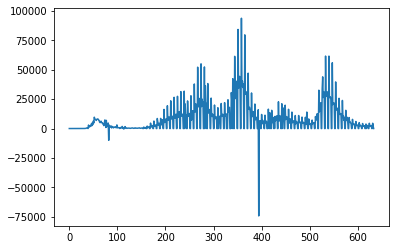

In [196]:
casos_spain=np.array(casos_spain)
nuevos_spain=casos_nuevos(casos_spain)
plt.plot(nuevos_spain)

## Italia

In [197]:
italy = data[data['location'] == 'Italy']
italy = italy.reset_index(drop=True)
italy.head(3)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,ITA,Europe,Italy,2020-01-31,2.0,2.0,NaN,NaN,NaN,NaN,...,19.8,27.8,NaN,3.18,83.51,0.892,NaN,NaN,NaN,NaN
1,ITA,Europe,Italy,2020-02-01,2.0,0.0,NaN,NaN,NaN,NaN,...,19.8,27.8,NaN,3.18,83.51,0.892,NaN,NaN,NaN,NaN
2,ITA,Europe,Italy,2020-02-02,2.0,0.0,NaN,NaN,NaN,NaN,...,19.8,27.8,NaN,3.18,83.51,0.892,-6878.1,-9.02,-6.19,-113.93719


In [198]:
italy = italy[['location','date','total_cases']].dropna()

In [199]:
casos_principio = italy.total_cases[25:35]
dias_principio = np.arange(0,len(casos_principio))

In [200]:
#ajustamos
popt_italy, pcov_italy = curve_fit(exponencial, dias_principio, casos_principio)
popt_italy #valor de k

array([  0.24038734, -25.44296174])

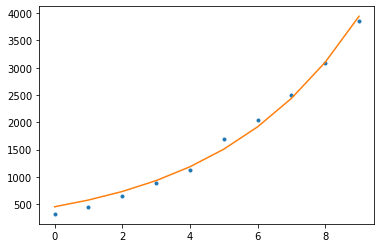

In [201]:
k=popt_italy[0]
t0=popt_italy[1]
casos_simu=exponencial(dias_principio,k,t0)
plt.plot(dias_principio,casos_principio,'.')
plt.plot(dias_principio,casos_simu)

Text(0, 0.5, 'cantidad de casos')

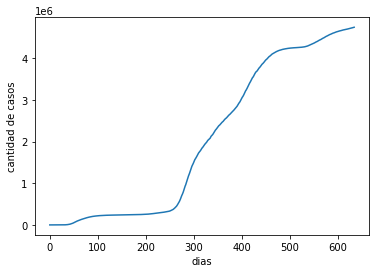

In [202]:
ind_italy=np.where(paises=='Italy')
ind_italy=ind_italy[0]
casos_italy=confirmados[ind_italy]
dias=np.arange(0,len(casos_italy))
plt.plot(dias,casos_italy)
plt.xlabel('dias')
plt.ylabel('cantidad de casos')

**Casos nuevos por dia**

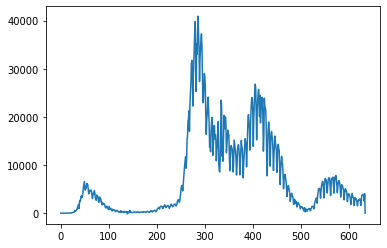

In [203]:
casos_italy=np.array(casos_italy)
nuevos_italy=casos_nuevos(casos_italy)
plt.plot(nuevos_italy)

## Japon

In [204]:
japon = data[data['location'] == 'Japan']
japon = japon.reset_index(drop=True)
japon.head(3)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,JPN,Asia,Japan,2020-01-22,2.0,NaN,NaN,NaN,NaN,NaN,...,11.2,33.7,NaN,13.05,84.63,0.919,NaN,NaN,NaN,NaN
1,JPN,Asia,Japan,2020-01-23,2.0,0.0,NaN,NaN,NaN,NaN,...,11.2,33.7,NaN,13.05,84.63,0.919,NaN,NaN,NaN,NaN
2,JPN,Asia,Japan,2020-01-24,2.0,0.0,NaN,NaN,NaN,NaN,...,11.2,33.7,NaN,13.05,84.63,0.919,NaN,NaN,NaN,NaN


In [205]:
japon= japon[['location','date','total_cases']].dropna()

In [206]:
casos_principio = japon.total_cases[15:35]
dias_principio = np.arange(0,len(casos_principio))

In [207]:
#ajustamos
popt_jap, pcov_jap = curve_fit(exponencial, dias_principio, casos_principio)
popt_jap #valor de k

array([  0.12516712, -22.5978274 ])

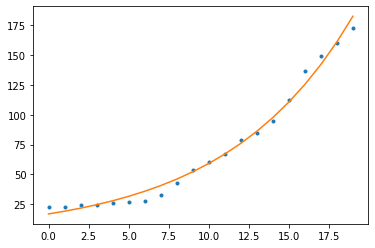

In [208]:
k=popt_jap[0]
t0=popt_jap[1]
casos_simu=exponencial(dias_principio,k,t0)
plt.plot(dias_principio,casos_principio,'.')
plt.plot(dias_principio,casos_simu)

Text(0, 0.5, 'cantidad de casos')

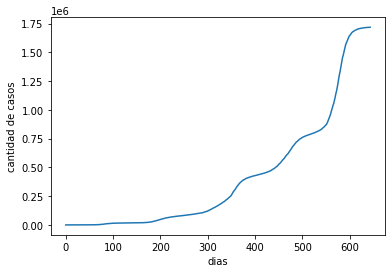

In [209]:
ind_japon=np.where(paises=='Japan')
ind_japon=ind_japon[0]
casos_japon=confirmados[ind_japon]
dias=np.arange(0,len(casos_japon))
plt.plot(dias,casos_japon)
plt.xlabel('dias')
plt.ylabel('cantidad de casos')

**Casos nuevos por dia**

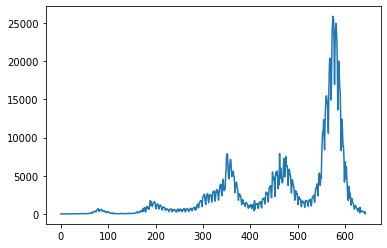

In [210]:
casos_japon=np.array(casos_japon)
nuevos_japon=casos_nuevos(casos_japon)
plt.plot(nuevos_japon)

## Panama

In [211]:
panama = data[data['location'] == 'Panama']
panama = panama.reset_index(drop=True)
panama.head(3)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,PAN,North America,Panama,2020-03-09,NaN,NaN,NaN,NaN,NaN,NaN,...,2.4,9.9,NaN,2.3,78.51,0.815,NaN,NaN,NaN,NaN
1,PAN,North America,Panama,2020-03-10,1.0,1.0,NaN,NaN,NaN,NaN,...,2.4,9.9,NaN,2.3,78.51,0.815,NaN,NaN,NaN,NaN
2,PAN,North America,Panama,2020-03-11,8.0,7.0,NaN,1.0,1.0,NaN,...,2.4,9.9,NaN,2.3,78.51,0.815,NaN,NaN,NaN,NaN


In [212]:
panama = panama[['location','date','total_cases']].dropna()

In [213]:
casos_principio = panama.total_cases[15:35]
dias_principio = np.arange(0,len(casos_principio))

In [214]:
#ajustamos
popt_pan, pcov_pan = curve_fit(exponencial, dias_principio, casos_principio)
popt_pan #valor de k

array([  0.09027374, -71.55434304])

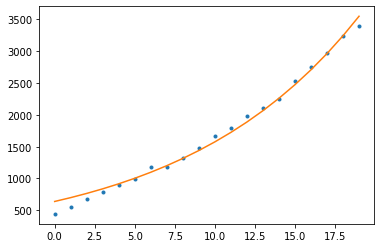

In [215]:
k=popt_pan[0]
t0=popt_pan[1]
casos_simu=exponencial(dias_principio,k,t0)
plt.plot(dias_principio,casos_principio,'.')
plt.plot(dias_principio,casos_simu)

Text(0, 0.5, 'cantidad de casos')

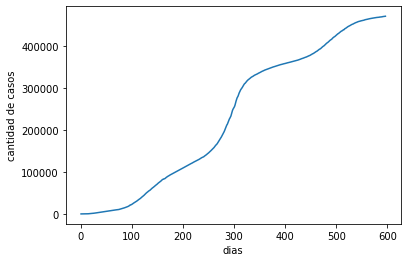

In [216]:
ind_panama=np.where(paises=='Panama')
ind_panama=ind_panama[0]
casos_panama=confirmados[ind_panama]
dias=np.arange(0,len(casos_panama))
plt.plot(dias,casos_panama)
plt.xlabel('dias')
plt.ylabel('cantidad de casos')

**Casos nuevos por dia**

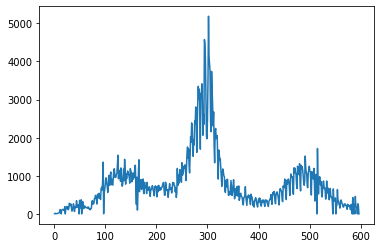

In [217]:
casos_panama=np.array(casos_panama)
nuevos_panama=casos_nuevos(casos_panama)
plt.plot(nuevos_panama)

## Rusia

In [218]:
rusia = data[data['location'] == 'Russia']
rusia = rusia.reset_index(drop=True)
rusia.head(3)


,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,RUS,Europe,Russia,2020-01-31,2.0,2.0,NaN,NaN,NaN,NaN,...,23.4,58.3,NaN,8.05,72.58,0.824,-1324.6,-0.8,-0.8,-9.078073
1,RUS,Europe,Russia,2020-02-01,2.0,0.0,NaN,NaN,NaN,NaN,...,23.4,58.3,NaN,8.05,72.58,0.824,NaN,NaN,NaN,NaN
2,RUS,Europe,Russia,2020-02-02,2.0,0.0,NaN,NaN,NaN,NaN,...,23.4,58.3,NaN,8.05,72.58,0.824,NaN,NaN,NaN,NaN


In [219]:
rusia = rusia[['location','date','total_cases']].dropna()

In [220]:
casos_principio = rusia.total_cases[15:40]
dias_principio = np.arange(0,len(casos_principio))

In [221]:
#ajustamos
popt_rus, pcov_rus = curve_fit(exponencial, dias_principio, casos_principio)
popt_rus #valor de k

array([0.20823209, 9.29507536])

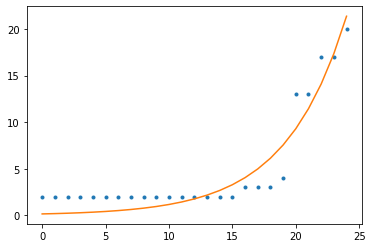

In [222]:
k=popt_rus[0]
t0=popt_rus[1]
casos_simu=exponencial(dias_principio,k,t0)
plt.plot(dias_principio,casos_principio,'.')
plt.plot(dias_principio,casos_simu)

Text(0, 0.5, 'cantidad de casos')

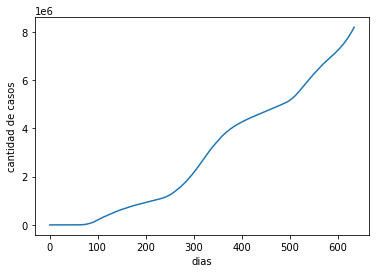

In [223]:
ind_rusia=np.where(paises=='Russia')
ind_rusia=ind_rusia[0]
casos_rusia=confirmados[ind_rusia]
dias=np.arange(0,len(casos_rusia))
plt.plot(dias,casos_rusia)
plt.xlabel('dias')
plt.ylabel('cantidad de casos')

**Casos nuevos por dia**

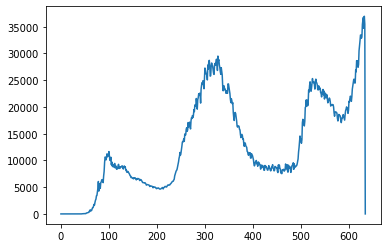

In [224]:
casos_rusia=np.array(casos_rusia)
nuevos_rusia=casos_nuevos(casos_rusia)
plt.plot(nuevos_rusia)

## Guatemala

In [225]:
guatemala = data[data['location'] == 'Guatemala']
guatemala = guatemala.reset_index(drop=True)
guatemala.head(3)


,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,GTM,North America,Guatemala,2020-02-17,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,76.665,0.6,74.3,0.663,NaN,NaN,NaN,NaN
1,GTM,North America,Guatemala,2020-02-18,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,76.665,0.6,74.3,0.663,NaN,NaN,NaN,NaN
2,GTM,North America,Guatemala,2020-02-19,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,76.665,0.6,74.3,0.663,NaN,NaN,NaN,NaN


In [226]:
guatemala = guatemala[['location','date','total_cases']].dropna()

In [227]:
casos_principio = guatemala.total_cases[10:35]
dias_principio = np.arange(0,len(casos_principio))

In [228]:
#ajustamos
popt_guat, pcov_guat = curve_fit(exponencial, dias_principio, casos_principio)
popt_guat #valor de k

array([  0.09903176, -30.60159988])

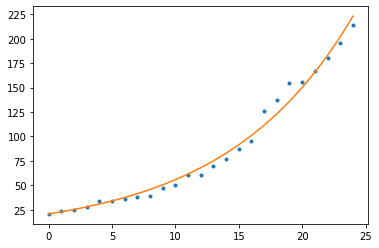

In [229]:
k=popt_guat[0]
t0=popt_guat[1]
casos_simu=exponencial(dias_principio,k,t0)
plt.plot(dias_principio,casos_principio,'.')
plt.plot(dias_principio,casos_simu)

Text(0, 0.5, 'cantidad de casos')

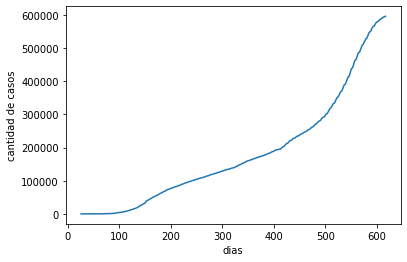

In [230]:
ind_guatemala=np.where(paises=='Guatemala')
ind_guatemala=ind_guatemala[0]
casos_guatemala=confirmados[ind_guatemala]
dias=np.arange(0,len(casos_guatemala))
plt.plot(dias,casos_guatemala)
plt.xlabel('dias')
plt.ylabel('cantidad de casos')

**Casos nuevos por dia**

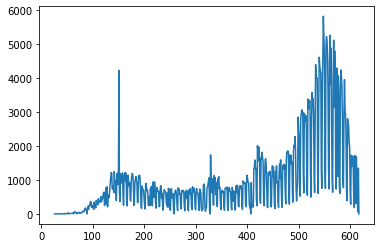

In [231]:
casos_guatemala=np.array(casos_guatemala)
nuevos_guatemala=casos_nuevos(casos_guatemala)
plt.plot(nuevos_guatemala)

In [232]:
import pandas as pd
k_arg = np.array(round(popt_arg[0],6))
k_aus = np.array(round(popt_aus[0],6))
k_can = np.array(round(popt_can[0],6))
k_col = np.array(round(popt_col[0],6))
k_ger = np.array(round(popt_ger[0],6)) 
k_guat = np.array(round(popt_guat[0],6)) 
k_italy = np.array(round(popt_italy[0],6)) 
k_jap = np.array(round(popt_jap[0],6)) 
k_pan = np.array(round(popt_pan[0],6)) 
k_rus = np.array(round(popt_rus[0],6)) 
k_spain = np.array(round(popt_spain[0],6)) 


valor_k = pd.DataFrame([[k_arg,k_aus, k_can, k_col, k_ger, k_guat, k_italy, k_jap, k_pan, k_rus, k_spain]], columns={'Argentina','Australia', 'Canada', 'Colombia', 'Germany', 'Guatemala', 'Italia', 
                                                                                                                    'Japon', 'Panama', 'Rusia', 'Spain'}).T
valor_k = valor_k.rename(columns = {0:'valor_de_k'}) 
valor_k

,valor_de_k
Germany,0.075216
Australia,0.229611
Japon,0.080686
Rusia,0.106757
Colombia,0.367804
Guatemala,0.099032
Italia,0.240387
Panama,0.125167
Argentina,0.090274
Spain,0.208232


In [233]:
import plotly.express as px

# Intervalo de confianza

In [234]:
from sklearn.utils import resample

bootstrap = resample(valor_k, replace = True, n_samples = 11, random_state = 40)
print(len(bootstrap)) 

11


In [235]:
bootstrap_mean =  np.mean(bootstrap)
bootstrap_mean

valor_de_k    0.144528
dtype: float64

In [236]:
boot_95 = np.percentile(bootstrap, [2.5,97.5])
print('95% = ', boot_95)

95% =  [0.080686 0.30141825]


***Encontramos la media bootstrap y su respectivo intervalo de confianza que muestra un intervalo con un rango bastante amplio, debido a la distribucion de nuestros datos originales. Cada pais tiene un valor de k diferente, el cual depende de otras variables u factores como el autocuidado de cada persona, la cantidad de poblacion de cada pais, el tamaño territorial, el sistema de salud, lo cual hace que los contagios crescan de manera rapida como sucedio con estados unidos, pero con el paso del tiempo los contagios empezaron a disminuir.***

***Podriamos considerarlo como un buen modelo teniendo en cuenta como son los datos originales, es lo que se esperaba como resutado, ademas es importante elegir la poblacion de la muestra, por que en este caso se considero la curva en el momento que tiende de manera exponencial. Si se hubiera tomado en otro punto, la diferencia quizas hubiera sido mayor o menor***

# Graficas que aportan informacion para el entendimiento e interpretacion de los datos

Para darle una mejor interpretacion a los datos, analizaremos 5 paises de latinoamerica y 5 paises que sean potencias mundiales. 

Para esto vamos a seleccionar paises similares en su PIB o gdp_per_capita

In [22]:
data[["year", "month", "day"]] = data["date"].str.split("-", expand = True).astype(int)

In [23]:
no_estricto_df = data[data['year'] == 2020]

#no_estricto_df = no_estricto_df[no_estricto_df.stringency_index < 50]

no_estricto_df = no_estricto_df[no_estricto_df["gdp_per_capita"] >= 10000]

no_estricto_df = no_estricto_df[no_estricto_df["gdp_per_capita"] <= 15000]

no_estricto_df.location.unique()

no_estricto_df = no_estricto_df.reset_index(drop=True)

no_estricto_df.location.unique()

array(['Albania', 'Algeria', 'Bosnia and Herzegovina', 'Brazil',
       'Colombia', 'Dominican Republic', 'Ecuador', 'Egypt', 'Grenada',
       'Indonesia', 'Lebanon', 'Mongolia', 'North Macedonia', 'Peru',
       'Saint Lucia', 'Saint Vincent and the Grenadines', 'Serbia',
       'South Africa', 'Sri Lanka', 'Suriname', 'Tunisia'], dtype=object)

Escogemos 5 paises: 

1.  Colombia
2.  Dominican Republic
3.  Ecuador
4.  Brazil
5.  Peru

In [25]:
estricto_df = data[data['year'] == 2020]

#estricto_df = estricto_df[estricto_df.stringency_index >= 50]

estricto_df = estricto_df[estricto_df["gdp_per_capita"] >= 45000] 

estricto_df = estricto_df[estricto_df["gdp_per_capita"] <= 116000]

estricto_df = estricto_df.reset_index(drop=True)

estricto_df.location.unique()

array(['Austria', 'Brunei', 'Cayman Islands', 'Denmark', 'Germany',
       'Hong Kong', 'Iceland', 'Ireland', 'Kuwait', 'Luxembourg',
       'Netherlands', 'Norway', 'San Marino', 'Saudi Arabia', 'Singapore',
       'Sweden', 'Switzerland', 'United Arab Emirates', 'United States'],
      dtype=object)

Escogemos 5 paises:
1. Austria 
2. Germany
3. United states
4. Iceland
5. Netherlands

## Paises de latinoamerica

In [26]:
import plotly.express as px

In [27]:
paises_sa = ['Colombia', 'Dominican Republic', 'Ecuador', 'Brazil', 'Peru']

paises_sur = data.loc[data['location'].isin(paises_sa)]  
paises_sur = paises_sur.reset_index(drop = True)
paises_sur.shape

(3084, 68)

In [28]:
fig = px.line(paises_sur, x="date", y="total_cases", color='location')
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de casos totales de coronavirus en 5 paises de Latino America', 'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()

In [29]:
for i in paises_sa:

    fig  = px.bar(paises_sur[paises_sur['location'] == i], x = 'date', y= 'total_cases', color = 'total_cases', orientation='v', height=600,
                  title=i, color_discrete_sequence= px.colors.cyclical.IceFire)
    fig.update_layout(plot_bgcolor='rgb(230,230,230)')
    fig.show()

In [30]:
fig = px.line(paises_sur, x="date", y="total_deaths", color='location', text="month") 
 
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de muertes totales de coronavirus en 5 paises de Latino America', 'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show() 


**podemos observar la linea de tendencia de muertes totales para los 5 paises de latinoamerica. Brazil es un pais que tiene la tasa de muertes mas alta en comparacion a los demas paises.**

#--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

El siguiente codigo corre la imagen de abajo. Pero se comento el codigo, ya que el bar de todo el data es muy pesado para dejarlo corriendo en el notebook. 

In [349]:
#fig = px.bar(data, y='total_deaths', x='continent', text='total_deaths')
#fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
#fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
#fig.show()


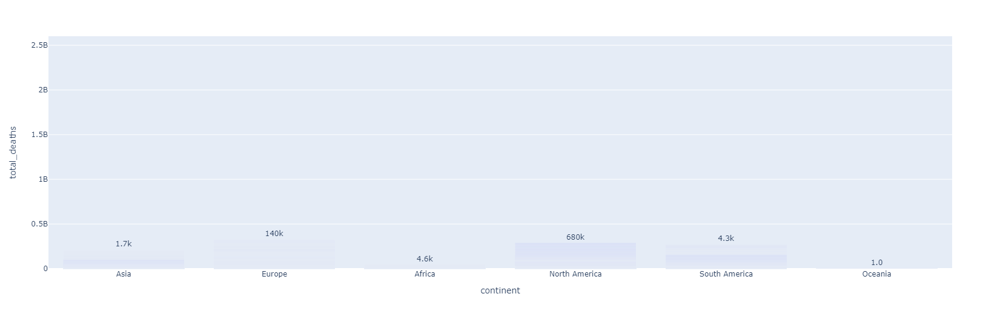

In [31]:
fig = px.bar(paises_sur, y='total_deaths', x='location', text='total_deaths')
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.update_layout(
    title = {
        'text' : 'Cantidad de personas muertas por coronavirus en 5 paises de Latino America', 'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()

In [32]:
fig = px.line(paises_sur[paises_sur['year'] == 2021], x="date", y="people_fully_vaccinated", color='location',text="month") 
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de las personas vacunadas completamente en 5 paises de Latino America (politica publica)', 'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()

In [33]:
fig = px.line(paises_sur, x="date", y="stringency_index", color='location')
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de la cuarentena estricta en 5 paises de Latino America (politica publica)', 'y':0.95, 
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()


In [353]:
cases = paises_sur[['location', 'total_cases', 'total_vaccinations']]
cases.sort_values('total_cases', ascending=False, inplace=True)

c:\users\pulzara\miniconda3\envs\sp3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [354]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_bar(x=cases['location'],y= cases['total_cases'],name = 'casos totales')
fig.add_bar(x=cases['location'],y= cases["total_vaccinations"], name= 'vacunados')
fig.update_layout(barmode="relative")
fig.update_layout(
    title = {
        'text' : 'Diagrama de barras de los casos totales de coronavirus y las personas vacunadas en 5 paises de Latino America', 'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()

In [355]:
fig = px.line(paises_sur, x="date", y="icu_patients", color='location') 
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de la cuarentena estricta en 5 paises de latino america (politica publica)', 'y':0.95, 
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()


**Es importante destacar que no se encuentran valores, debido a que dentro de la columna icu_patients, se encuentra una cantidad de nulls bastante grande, por razones que no conocemos pero podemos teorizar que se debe a la falta de informacion de datos reales sobre la situacion en latam y el covid. O simplemente es error del dataset o como se creo la base de datos.**

#--------------------------------------------------------------------------------------------------------------------------------------------------------------------

## Paises potencias mundiales 

In [34]:
paises_ma = ['Austria', 'Russia', 'United States', 'Iceland', 'Netherlands']  

paises_pm = data.loc[data['location'].isin(paises_ma)]  

paises_pm = paises_pm.reset_index(drop = True) 

In [35]:
fig = px.line(paises_pm, x="date", y="total_cases", color='location')
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de casos totales de coronavirus en 5 paises del primer mundo', 'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()

In [36]:
for i in paises_ma:

    fig  = px.bar(paises_pm[paises_pm['location'] == i], x = 'date', y= 'total_cases', color = 'total_cases', orientation='v', height=600,
                  title=i, color_discrete_sequence= px.colors.cyclical.IceFire)
    fig.update_layout(plot_bgcolor='rgb(230,230,230)')
    fig.show()

In [37]:
fig = px.line(paises_pm, x="date", y="total_deaths", color='location', text="month")
 
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de muertes totales de coronavirus en 5 paises del primer mundo', 'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()


In [39]:
fig = px.bar(paises_pm, y='total_deaths', x='location', text='total_deaths')
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.update_layout(
    title = {
        'text' : 'Cantidad de personas muertas por coronavirus en 5 paises del primer mundo', 'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()

In [40]:
fig = px.line(paises_pm[paises_pm['year'] == 2021], x="date", y="people_fully_vaccinated", color='location',text="month") 
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de las personas vacunadas completamente en 5 paises del primer mundo (politica publica)', 'y':0.95, 
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()

In [38]:
fig = px.line(paises_pm, x="date", y="stringency_index", color='location')
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de la cuarentena estricta en 5 paises del primer mundo (politica publica)', 'y':0.95, 
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()


In [362]:
cases1 = paises_pm[['location', 'total_cases', 'total_vaccinations']]
cases1.sort_values('total_cases', ascending=False, inplace=True)

In [363]:
fig = go.Figure()
fig.add_bar(x=cases1['location'],y= cases1['total_cases'],name = 'casos totales')
fig.add_bar(x=cases1['location'],y= cases1["total_vaccinations"], name= 'vacunados')
fig.update_layout(barmode="relative")
fig.update_layout(
    title = {
        'text' : 'Diagrama de barras de los casos totales de coronavirus y las personas vacunadas en 5 paises del primer mundo', 'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()

In [364]:
fig = px.line(paises_pm, x="date", y="icu_patients", color='location')
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de la cuarentena estricta en 5 paises del primer mundo (politica publica)', 'y':0.95, 
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()


# Elegimos una politica publica para armar la clasificacion y tres indicadores

Dentro del dataset, se pueden identificar dos politicas publicas, segun las graficas anteriores: 

La primera es la columna de stringency_index que me da un valor entre 0 y 100, que indica la cuarentena estricta de cada pais, siendo 100 un valor mas alto de cuarentea aplicado.

La segunda politica es la aplicacion de las vacunas, que practicamente es obligatoria. Sin embargo, tambien se puede analizar el impacto que tuvo en la poblacion, debido a que no todo el mundo se la aplico. 

Para este caso vamos a quedarnos con la columna de stringency_index

1. Los paises escogidos anteriormente, fueron seleccionados ya que cumplen con unas caracteristicas similares que se pueden entrar a analizar bajo la politica publica, y se trabaja bajo el supuesto de que paises con un stringency_index por debajo de 50 no aplican la restriccion y por encima de 50 si aplican la cuarentena.(Esto ya esta demostrado en la parte de arriba).
De acuerdo a las graficas anteriores de Stringency_index, vamos a analizar dos rangos de fechas diferentes, en la cuales se aplico la politica, y cuando no se aplico la politica.Posteriormente hacer la comparacion con paises de sur america vs paises potencias mundiales.
    
    A. Durante el periodo de tiempo de 1-Marzo-2020 - 17-Marzo-2020 NO se aplico cuarentena estricta
    
    B. Durante el periodo de tiempo de 20-Marzo-2020 - 13-Abril-2020 SI se aplico cuarentena estricta

Algunos indicadores que podemos utilizar son:
1. EL primer indicador consta en determinar en que punto en el tiempo aumenta o disminuye el stringecny index, y en la grafica de numero de casos vs tiempo, obtener  el valor de k y realizar la comparacion entre los paises de suramerica vs los paises que son potencias mundiales.
2. En el segundo indicador, en el mismo rango de tiempo, determinar la media de cuantas personas murieron.
3. En el tercer indicador, determinar la media de cuantas personas se infectaron.

## Primer Indicador 

Vamos a analizar el numero de casos vs dias. y Encontrar el valor de k para posteriormente ser comparado con los demas paises. 
Como se analizo anteriormente en la grafica de Stringency index vs date, encontramos dos intervalos de tiempo interesantres para analizar que son:
1. cuando empieza a crecer la cuarentena estricta.
2. cuando la cuarentena estrica es aplicada, es decir que toma valores maximos.  

In [12]:
#paises_sur['binario'] = np.where(paises_sur.stringency_index >= 50, 1,0)

**Seleccionamos las fechas desde 2020-03-01 hasta 2020-03-17 para el primer analisis**
*Creamos dos nuevos datasets para paises de suramerica y paises potencia mundial para el periodo de tiempo donde se aplico la politica estricta*

De aceurdo a las graficas anteriores, se puede observar que la curva en el periodo de tiempo entre 2020-03-01 hasta 2020-03-17, ................ 

In [13]:
paises_sur2 = paises_sur[(paises_sur.date >= '2020-03-01') & (paises_sur.date <= '2020-03-17')]
#paises_sur2 = paises_sur2[paises_sur2.stringency_index < 50] 
paises_sur2 = paises_sur2.reset_index(drop = True)


In [14]:
paises_sur2.loc[paises_sur2['location'] == 'Peru'].shape

(17, 68)

In [15]:
paises_pm2 = paises_pm[(paises_pm.date >= '2020-03-01') & (paises_pm.date <= '2020-03-17')]
paises_pm2 = paises_pm2[paises_pm2.stringency_index < 50]
paises_pm2 = paises_pm2.reset_index(drop = True) 

In [16]:
paises_pm2.location.unique()

array(['Austria', 'Iceland', 'Netherlands', 'Russia', 'United States'],
      dtype=object)

### Paises sur america

El valor k es: 
[[0.408588, 'Colombia'], [0.215049, 'Dominican Republic'], [0.154398, 'Ecuador'], [0.290428, 'Brazil'], [0.391327, 'Peru']]


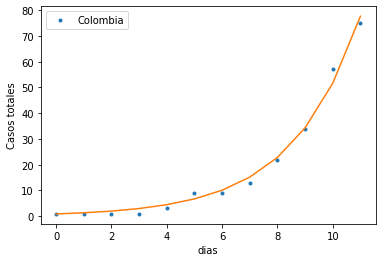

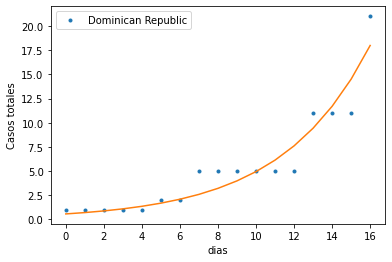

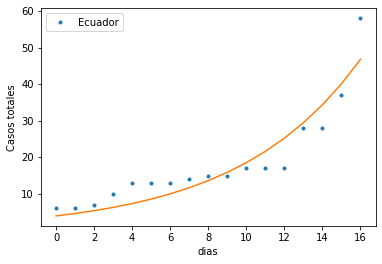

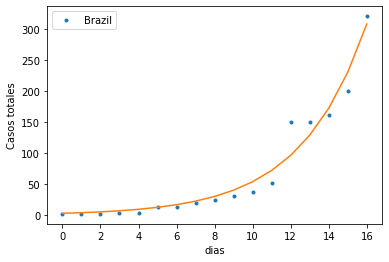

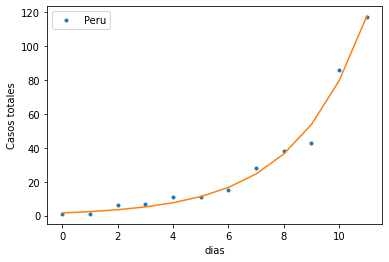

In [17]:
paises_sa = ['Colombia', 'Dominican Republic', 'Ecuador', 'Brazil', 'Peru']
value_k = []
ajustes = []
days = []
for i in paises_sa:
    germany = paises_sur2[paises_sur2['location'] == i] 
    germany = germany.reset_index(drop=True)
    germany.head(3)

    germany = germany[['location','date','total_cases']].dropna() 
    casos_principio = germany.total_cases
    dias_principio = np.arange(0,len(casos_principio))
    
    days.append([len(dias_principio), i])   
    

    #ajustamos
    popt_ger, pcov_ger = curve_fit(exponencial, dias_principio, casos_principio)
    popt_ger #valor de k

    k=popt_ger[0]
    t0=popt_ger[1]
    
    ajustes.append([k,t0])
    
    value_k.append([round(k,6),i]) 
    
    casos_simu_sa=exponencial(dias_principio,k,t0)
    
    fig, ax = plt.subplots()  
    ax.plot(dias_principio,casos_principio,'.')
    ax.plot(dias_principio,casos_simu_sa)
    ax.legend([i])
    plt.ylabel('Casos totales')
    plt.xlabel('dias') 
    
print('El valor k es: ')
print(value_k) 

Se puede observar en la grafica el ajuste del valor K (contagiosidad) de los casos totales durante el primero periodo de tiempo, donde la cuarentena no se habia implementado. Es posible determinar que la exponencial se ajusta muy bien a las curvas para cada pais de sur america. Es posible determinar que brazil alcanzo mas casos totales en 16 dias, en comparacion a los demas paises. 
Es posible determinar que colombia alcanzo mas rapido el numero de casos que otros paises, en tan solo 10 dias. Brazil despues de los 10 dias, tuvo un incremento muy grande de casos, sin embargo en colombia ocurrio mas rapido durante este tiempo. 

### Paises potencias mundiales

El valor k es: 
[[0.311098, 'Austria'], [0.243285, 'Russia'], [0.270973, 'United States'], [0.181749, 'Iceland'], [0.23685, 'Netherlands']]


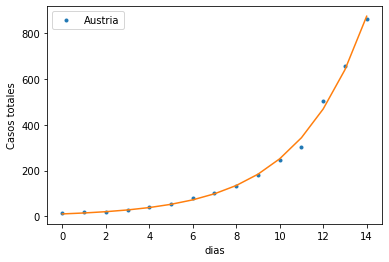

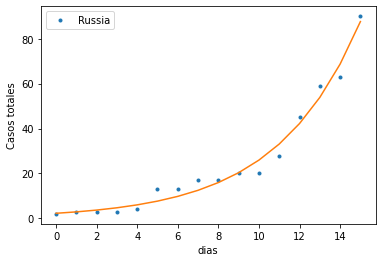

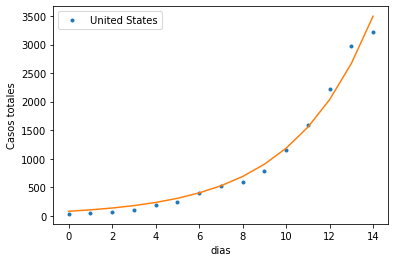

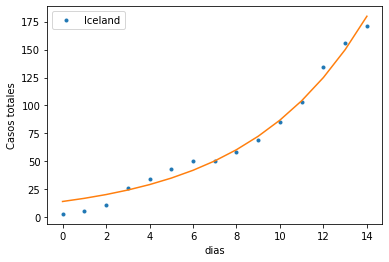

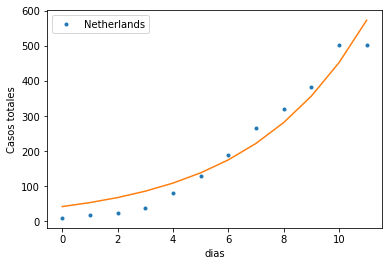

In [18]:
paises_ma = ['Austria', 'Russia', 'United States', 'Iceland', 'Netherlands']  
value_k2 = [] 
ajustes2 = []
days2 = []
for i in paises_ma:
    germany = paises_pm2[paises_pm2['location'] == i] 
    germany = germany.reset_index(drop=True)

    germany = germany[['location','date','total_cases']].dropna()
    casos_principio = germany.total_cases
    dias_principio = np.arange(0,len(casos_principio))
    
    days2.append([len(dias_principio), i])   
       

    #ajustamos
    popt_ger, pcov_ger = curve_fit(exponencial, dias_principio, casos_principio)
    popt_ger #valor de k

    k=popt_ger[0]
    t0=popt_ger[1]
    
    ajustes2.append([k,t0])
    
    value_k2.append([round(k,6),i]) 
    
    casos_simu_pm = exponencial(dias_principio,k,t0)
    
    fig, ax = plt.subplots()  
    ax.plot(dias_principio,casos_principio,'.')
    ax.plot(dias_principio,casos_simu_pm)
    ax.legend([i]) 
    plt.ylabel('Casos totales')
    plt.xlabel('dias') 
    
    
print('El valor k es: ')
print(value_k2) 

Se puede observar en la grafica el ajuste del valor K (contagiosidad) de los casos totales durante el primero periodo de tiempo, donde la cuarentena no se habia implementado. Es posible determinar que la exponencial se ajusta muy bien a las curvas para cada pais que es potencia.
Podemos observar que los comportamientos de las graficas tienen una tendencia similar, por lo que se espera que el valor k sean muy aproximados. 

In [19]:
v_k1 = pd.DataFrame(value_k)   
v_k1.rename(columns={0:'valor_k', 1:'Country'}, inplace=True)
v_k1.sort_values(by='valor_k', ascending=False)  

,valor_k,Country
0,0.408588,Colombia
4,0.391327,Peru
3,0.290428,Brazil
1,0.215049,Dominican Republic
2,0.154398,Ecuador


*El valor k de contgiosidad es mayor en Colombia, lo que se espera es que en este pais las personas se hayan contagiado mas rapidamente, seguido de Peru con una diferencia de 0.01. Y el ultimo pais con el menor valor es Ecuador.*


In [20]:
v_k2 = pd.DataFrame(value_k2)   
v_k2.rename(columns={0:'valor_k', 1:'Country'}, inplace=True)    
v_k2.sort_values(by='valor_k', ascending=False)   

,valor_k,Country
0,0.311098,Austria
2,0.270973,United States
1,0.243285,Russia
4,0.236850,Netherlands
3,0.181749,Iceland


El mayor valor de k se encuentra en Austria, seguido de USA. Segun lo mencionado anteriormente de la tendencia de las graficas para estos paises que son potencias, el valor de k, es muy aproximado entre ellos. Quizas se deba a que la manera en como se maneja los problemas de salud, politica, etc, son muy diferentes a como se maneja en paises de sur america.  

### Valores medios para v_k1 y v_k2

In [21]:
vk1_m = v_k1.valor_k.mean() 
vk2_m = v_k2.valor_k.mean() 
print(f"El valor medio de k para los paises de sur america es {vk1_m}, y el valor medio de k para los paises potencias mundiales es {vk2_m}") 

El valor medio de k para los paises de sur america es 0.291958, y el valor medio de k para los paises potencias mundiales es 0.24879099999999998


### Intervalo de confianza para el valor medio de k de los paises de sur america cuando la politica de cuarentena no es estricta

 #### Intervalo de confianza para k1

In [22]:
from sklearn.utils import resample

bootstrap = resample(v_k1.valor_k, replace = True, n_samples = 5, random_state = 40) 


bootstrap_mean =  np.mean(bootstrap)
print('el valor medio de k para paises de sur america es: ', bootstrap_mean)

boot_95 = np.percentile(bootstrap, [2.5,97.5])
print('95% = ', boot_95)

el valor medio de k para paises de sur america es:  0.2954102
95% =  [0.1604631 0.408588 ]


 #### Intervalo de confianza para k2

In [23]:
from sklearn.utils import resample

bootstrap = resample(v_k2.valor_k, replace = True, n_samples = 5, random_state = 40)   

bootstrap_mean =  np.mean(bootstrap)
print('el valor medio de k para paises potencias mundiales es: ',bootstrap_mean) 

boot_95 = np.percentile(bootstrap, [2.5,97.5])
print('95% = ', boot_95)

el valor medio de k para paises potencias mundiales es:  0.26364059999999995
95% =  [0.1879026 0.311098 ]


*Podemos comparar los valores medios de k para los paises de sur america y los paises potencias, donde el valor k me mide la contagiosidad de una persona, entre mayor sea el valor mayor sera la cantidad de contagios. por lo tanto, se puede evidenciar que para los paises de sur america, la cantidad de contagios es mayor por un valor aproximado de 0.04 respecto a el k de los paises potencias, en el internvalo de tiempo donde la politica de la cuarentena no era estricta (01/marzo/2020 - 17/marzo/202).*

#----------------------------------------------------------------------------------------------------------------------------------------------------#

## Segundo indicador
### **Seleccionamos las fechas desde 2020-03-20 hasta 2020-07-01 para el primer analisis**
*Creamos dos nuevos datasets para paises de suramerica y paises potencia mundial, calculamos como seria el comportamiento sin cuarentena durante este tiempo y obtenemos el error relativo de la media teorica con la experimental*

In [24]:
paises_sur3 = paises_sur[(paises_sur.date >= '2020-03-20') & (paises_sur.date <= '2020-07-01')]
#paises_sur3 = paises_sur3[paises_sur3.stringency_index >= 50]  
paises_sur3 = paises_sur3.reset_index(drop = True)
print(paises_sur3.location.unique(), paises_sur3.shape) 

['Brazil' 'Colombia' 'Dominican Republic' 'Ecuador' 'Peru'] (520, 68)


In [25]:
paises_pm3 = paises_pm[(paises_pm.date >= '2020-03-20') & (paises_pm.date <= '2020-07-01')]
#paises_pm3 = paises_pm3[paises_pm3.stringency_index >= 50]
paises_pm3 = paises_pm3.reset_index(drop = True) 
print(paises_pm3.location.unique(), paises_pm3.shape) 

['Austria' 'Iceland' 'Netherlands' 'Russia' 'United States'] (520, 68)


### Paises sur america

El valor medio es: 
[[23534.51, 'Colombia'], [12054.558, 'Dominican Republic'], [27445.404, 'Ecuador'], [371516.433, 'Brazil'], [100901.75, 'Peru']]


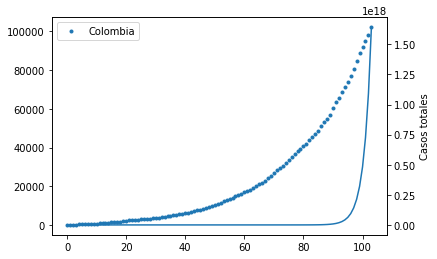

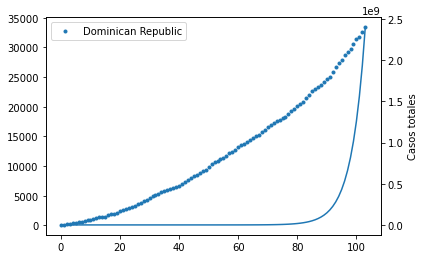

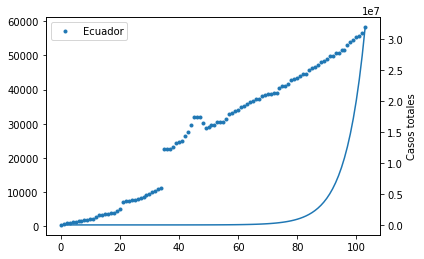

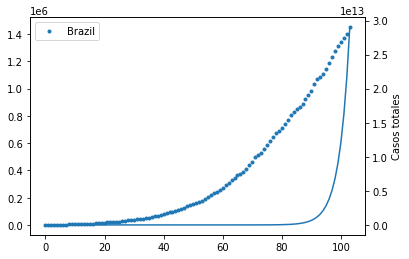

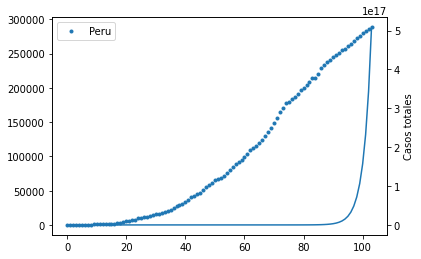

In [26]:
"""
la variable dias principio, hace referencia a los dias que se estan analizando.
"""


paises_sa = ['Colombia', 'Dominican Republic', 'Ecuador', 'Brazil', 'Peru']
media_k3 = []
teorico = []
#casos_simu_sa2 = [] 

j = 0        
for i in paises_sa:
    germany = paises_sur3[paises_sur3['location'] == i] 
    germany = germany.reset_index(drop=True)

    media_k3.append([round(germany.total_cases.mean(),3), i])  

    germany = germany[['location','date','total_cases']].dropna()
    casos_principio = germany.total_cases
    dias_principio = np.arange(0,len(casos_principio))
    
    
    
    
    
    casos_simu_sa2=exponencial(dias_principio,ajustes[j][0],ajustes[j][1])
    teorico.append([float(casos_simu_sa2.mean()),i]) 
    j=j+1
    
    fig, ax = plt.subplots()
    
    ax.plot(dias_principio,casos_principio,'.') 
    
    #ax.plot(dias_principio, casos_simu_sa)  
    ax1 = ax.twinx()

    ax1.plot(dias_principio,casos_simu_sa2) 
    ax.legend([i])
    plt.ylabel('Casos totales')
    plt.xlabel('dias') 
    
print('El valor medio es: ')
print(media_k3)   

Podemos observar en las graficas la interpolacion del ajuste y la nueva tendencia de los casos totales, suponiendo que no se implemento la cuarentena (valores teoricos) contra los valores reales (si se implemento la cuarentena).

### Paises potencias mundiales

El valor medio es: 
[[14680.173, 'Austria'], [251432.231, 'Russia'], [1290370.596, 'United States'], [1649.154, 'Iceland'], [36655.279, 'Netherlands']]


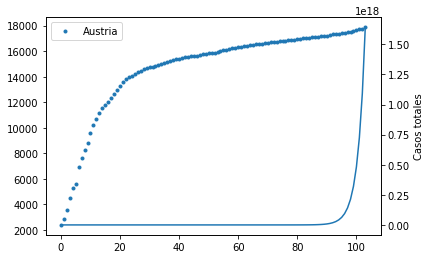

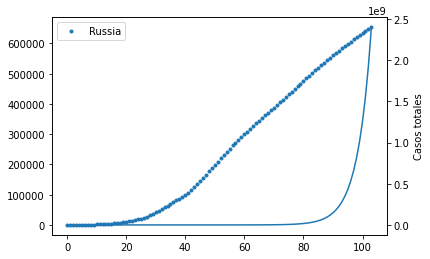

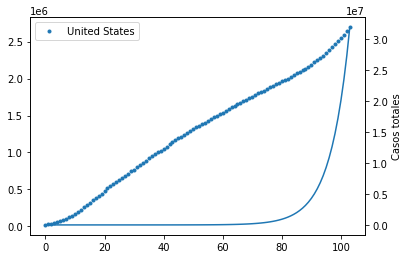

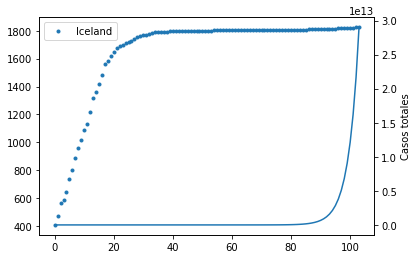

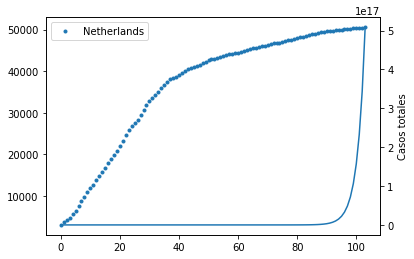

In [27]:
paises_ma = ['Austria', 'Russia', 'United States', 'Iceland', 'Netherlands'] 
media_k4 = [] 
teorico2 = []

j = 0      
for i in paises_ma:
    germany = paises_pm3[paises_pm3['location'] == i]  
    germany = germany.reset_index(drop=True)

    media_k4.append([round(germany.total_cases.mean(),3), i])
    
    germany = germany[['location','date','total_cases']].dropna()
    casos_principio = germany.total_cases 
    dias_principio = np.arange(0,len(casos_principio))
    
    
    
    
    casos_simu_pm2 = exponencial(dias_principio,ajustes[j][0],ajustes[j][1])
    teorico2.append([casos_simu_pm2.mean(),i])
    j=j+1    
    
    
    fig, ax = plt.subplots()  
    
    ax.plot(dias_principio,casos_principio,'.')
    ax1 = ax.twinx()
    ax1.plot(dias_principio,casos_simu_pm2)
    ax.legend([i]) 
    plt.ylabel('Casos totales')
    plt.xlabel('dias') 
    
         
    
print('El valor medio es: ')
print(media_k4)   


    

Podemos observar en las graficas la interpolacion del ajuste y la nueva tendencia de los casos totales, suponiendo que no se implemento la cuarentena (valores teoricos) contra los valores reales (si se implemento la cuarentena). A diferencia de los paises de sur america, la curva real para Netherlands, Iceland, Austria, tienden a saturarse despues de 40 dias, y los casos totales no incrementan de manera exponencial. 

*Valor medio de los datos teoricos* 

In [28]:
teorico_sa =  pd.DataFrame(teorico)
teorico_sa.rename(columns={0:'media_teorica', 1:'Country'}, inplace=True) 
teorico_sa.sort_values(by = 'media_teorica') 

,media_teorica,Country
2,2.142120e+06,Ecuador
1,1.192240e+08,Dominican Republic
3,1.106678e+12,Brazil
4,1.509722e+16,Peru
0,4.707304e+16,Colombia


In [29]:
teorico_pm = pd.DataFrame(teorico2)
teorico_pm.rename(columns={0:'media_teorica', 1:'Country'}, inplace=True)  
teorico_pm 

,media_teorica,Country
0,4.707304e+16,Austria
1,1.192240e+08,Russia
2,2.142120e+06,United States
3,1.106678e+12,Iceland
4,1.509722e+16,Netherlands


*Valor medio de los datos experimentales*

In [30]:
v_k3 = pd.DataFrame(media_k3)
v_k3.rename(columns={0:'valor_medio', 1:'Country'}, inplace=True)   
v_k3.sort_values(by = 'valor_medio', ascending=False) 

,valor_medio,Country
3,371516.433,Brazil
4,100901.750,Peru
2,27445.404,Ecuador
0,23534.510,Colombia
1,12054.558,Dominican Republic


Podemos observar que para los paises de sur america, en un periodo de tiempo donde se aplico la cuarentena, el mayor valor medio de casos se enucentra ne brazil y el menor valor medio se encuentra en republica dominicana. Hay una diferencia muy grande entre cada valor medio para cada pais, esto podria deberse a la poblacion de cada region. 

In [31]:
v_k4 = pd.DataFrame(media_k4)   
v_k4.rename(columns={0:'valor_medio', 1:'Country'}, inplace=True)    
v_k4.sort_values(by = 'valor_medio', ascending=False) 

,valor_medio,Country
2,1290370.596,United States
1,251432.231,Russia
4,36655.279,Netherlands
0,14680.173,Austria
3,1649.154,Iceland


Para paises potencias mundiales, podemos establecer que el valor medio de mayor casos, se encuentra en USA. No podria esperarse menos, sabiendo como fue el aislamiento y como se trato la pandemia. La cantidad de casos para no dejar caer la economia fue muy abismal. Por otro lado la poblacion tambien juega un papel muy importante a la hora de contagios. 
Iceland, es mas pequeño en cuanto a territorio, por lo tanto hay menos casos de coronavirus. 

**Encontramos el error relativo de la media para los paises de sur america y los que son potencias mundiales, para detemrinar la diferencia entre el valor teorico y el valor real**

In [32]:
sa = teorico_sa.copy() 
sa = sa.merge(v_k3, on='Country')
sa['error_relativo %'] = ((sa['media_teorica'] - sa['valor_medio'])/sa['media_teorica'])*100
sa 

,media_teorica,Country,valor_medio,error_relativo %
0,4.707304e+16,Colombia,23534.510,100.000000
1,1.192240e+08,Dominican Republic,12054.558,99.989889
2,2.142120e+06,Ecuador,27445.404,98.718774
3,1.106678e+12,Brazil,371516.433,99.999966
4,1.509722e+16,Peru,100901.750,100.000000


In [33]:
sa2 = teorico_pm.copy()  
sa2 = sa2.merge(v_k4, on='Country')
sa2['error_relativo %'] = ((sa2['media_teorica'] - sa2['valor_medio'])/sa2['media_teorica'])*100
sa2 

,media_teorica,Country,valor_medio,error_relativo %
0,4.707304e+16,Austria,14680.173,100.000000
1,1.192240e+08,Russia,251432.231,99.789109
2,2.142120e+06,United States,1290370.596,39.761997
3,1.106678e+12,Iceland,1649.154,100.000000
4,1.509722e+16,Netherlands,36655.279,100.000000


*Se puede entender que el error es demasiado grande, debido a que la politica de cuarentena se implemento durante este periodo de tiempo. Por lo tanto, la tendencia exponencial no continuo, al contratio disminuyo respecto al tiempo significativamente.* 

#---------------------------------------------------------------------------------------------------------------------------------

### Valores medios para un periodo de tiempo donde la politica de cuarentena es estricta en los paises de sur america y paises potencias mundiales

In [34]:
vk3_m = v_k3.valor_medio.mean()  
vk4_m = round(v_k4.valor_medio.mean(),3)
print(f"El valor medio de k para los paises de sur america es {vk3_m}, y el valor medio de k para los paises potencias mundiales es {vk4_m}")  

El valor medio de k para los paises de sur america es 107090.531, y el valor medio de k para los paises potencias mundiales es 318957.487


*En el valor medio de los casos totales para paises que aplicaron cuarentena estricta, durante el periodo de tiempo, es posible determinar que los paises potencias mundiales, obtienen el valor medio mayor que el de los paises de sur america, posiblemente se deba ha que la pandemia llego mas rapido a paises europeos y USA. Despues siguio en Colombia, Brazil, Peru, Ecuador,..,etc.* 

## Tercer indicador  
En el tercer indicador, en el mismo rango de tiempo, determinar la media de cuantas personas murieron.

### Analizamos la primera parte de los paises de suramerica. 

*Analizamos entre las primeras fechas donde la politica no se ha implementado*

In [35]:
paises_surm = paises_sur[(paises_sur.date >= '2020-03-01') & (paises_sur.date <= '2020-03-17')]
paises_surm = paises_surm.reset_index(drop = True)

In [36]:
paises_surm = paises_surm[["date", "total_deaths_per_million", "location"]]
paises_surm.tail() 

,date,total_deaths_per_million,location
75,2020-03-13,0.09,Peru
76,2020-03-14,0.09,Peru
77,2020-03-15,0.15,Peru
78,2020-03-16,0.15,Peru
79,2020-03-17,0.27,Peru


In [39]:
fig = px.line(paises_surm, x="date", y="total_deaths_per_million", color='location')
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de muertes por coronavirus en 5 paises de sur america (politica publica)', 'y':0.95, 
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()


**podemos analizar que en peru las primeras muertes ocurrieron mas rapido que en alguno de los otros paises escogidos. Siendo el siguiente ecuador con un numero bastante alto de muertes por coronavirus.**

#-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [ ]:
"""*Estas graficas se pueden interpretar de diferentes maneras. La primera es que en los paises de Ecuador y Peru, se presentaron mas rapido los primeros casos de covid, o por lo menos fueros los paises que mas rapido reportaron este virus. Por otro lado, en el ministerio de Colombia, aparece un reporte del 6 de marzo como primer caso covid, asi que se podria tener en cuenta que hubo algun error al crear la base de datos.*

*Ecuador por ser mas grande y tener un poder adquisitivo mayor a colombia, ademas de su aeropuerto internacional, es una posible causa del por que empezo primero 

PROTESTAS, NIVEL ECONOMICO ES MAS GRANDE, PODER ADQUISITIVO, AEROPUERTO MAS GRANDE"""

In [40]:
paises_surm.total_deaths_per_million.mean() 

0.09355555555555556

In [41]:
paises_sa = ['Colombia', 'Dominican Republic', 'Ecuador', 'Brazil', 'Peru']
media_sa = []
for i in paises_sa:
   
    med = paises_surm[paises_surm['location'] == i].dropna() 
    media_sa.append([med['total_deaths_per_million'].mean(),i])   

media_sa1 =  pd.DataFrame(media_sa)  
media_sa1.rename(columns={0:'valor_medio_muertes_No', 1:'Country'}, inplace=True) 
media_sa1 

,valor_medio_muertes_No,Country
0,NaN,Colombia
1,0.091,Dominican Republic
2,0.112,Ecuador
3,0.005,Brazil
4,0.095,Peru


In [42]:
media_muertes_sur = np.mean(paises_surm.total_deaths_per_million)
print(f'El promedio de personas muertas por millon en paises de sur america, en cuarentena estricta es {round(media_muertes_sur,3)} billones')

El promedio de personas muertas por millon en paises de sur america, en cuarentena estricta es 0.094 billones


### Analizamos la primera parte de los paises potencias mundiales
Analizamos entre las primeras fechas donde la politica no se ha implementado

In [43]:
paises_pmm = paises_pm[(paises_pm.date >= '2020-03-01') & (paises_pm.date <= '2020-03-17')]
paises_pmm = paises_pmm.reset_index(drop = True) 

In [44]:
paises_pmm = paises_pmm[["date", "total_deaths_per_million", "location"]]
paises_pmm

,date,total_deaths_per_million,location
0,2020-03-01,NaN,Austria
1,2020-03-02,NaN,Austria
2,2020-03-03,NaN,Austria
3,2020-03-04,NaN,Austria
4,2020-03-05,NaN,Austria
...,...,...,...
80,2020-03-13,0.153,United States
81,2020-03-14,0.174,United States
82,2020-03-15,0.210,United States
83,2020-03-16,0.291,United States


In [45]:
fig = px.line(paises_pmm, x="date", y="total_deaths_per_million", color='location')
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de muertes por coronavirus en 5 paises del primer mundo (politica publica)', 'y':0.95, 
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()


Es posible determinar que al inicio de la pandemia, como era de esperarse USA, tiene un numero elevado de muertes, y fue uno de los paises mas afectados por coronavirus debido a sus pensamientos politicos. Sin embargo, podemos deducir que Netherlads tuvo un incremento en casos muy elevado para marzo 13 - Marzo 17, la cual podria atribuirse a una primera ola de infeccion. Los demas paises como Germany, Iceland, Austria, son los mas parecidos en cuanto a cantidad de muertes, posiblemente a su manejo y a su cultura de prevencion. 

In [46]:
paises_ma = ['Austria', 'Russia', 'United States', 'Iceland', 'Netherlands'] 
media_pm = []
for i in paises_ma:
 
    med = paises_pmm[paises_pmm['location'] == i].dropna() 
    media_pm.append([med['total_deaths_per_million'].mean(),i])   

media_pm1 =  pd.DataFrame(media_pm)  
media_pm1.rename(columns={0:'valor_medio_muertes_No', 1:'Country'}, inplace=True) 
media_pm1  

,valor_medio_muertes_No,Country
0,0.184667,Austria
1,NaN,Russia
2,0.110353,United States
3,NaN,Iceland
4,0.635750,Netherlands


In [47]:
media_muertes_potencias = np.mean(paises_pmm.total_deaths_per_million)
print(f'El promedio de personas muertas por millon en paises potencias mundiales, en cuarentena estricta es {round(media_muertes_potencias,3)} billones') 

El promedio de personas muertas por millon en paises de sur america, en cuarentena estricta es 0.303 billones


In [48]:
pd.DataFrame({media_muertes_sur, media_muertes_potencias}, index = {'paises suramerica', 'paises potencias'}, columns={'media'} )  

,media
paises suramerica,0.093556
paises potencias,0.303229


*Podemos observar que el promedio de la media de muertes durante la cuarentena no estrica es mayor en los paises potencias con un 0.2623 millones. Mientras que en los paises de suramerica fue de un 0.935 millones* .
*Sin embargo, hay valores que faltan para ambas tablas, que se puede dar debido a que el la pandemia llego primero a los paises europeos y estados unidos, que en latinoamerica. Por lo tanto el nivel de contagio crecio de una manera mas rapida e inesperada. Por otro lado, se puede deber tambien a que no se reportan los casos reales de muertes, o un error cuando se crearon las bases de datos.*

### Analizamos la segunda parte de los paises de suramerica
Analizamos entre las segundas fechas donde la politica si se implemento


In [49]:
paises_surm2 = paises_sur[(paises_sur.date >= '2020-03-20') & (paises_sur.date <= '2020-04-13')]
paises_surm2 = paises_surm2.reset_index(drop = True)

In [50]:
paises_surm2 = paises_surm2[["date", "total_deaths_per_million", "location"]]
paises_surm2

,date,total_deaths_per_million,location
0,2020-03-20,0.051,Brazil
1,2020-03-21,0.070,Brazil
2,2020-03-22,0.117,Brazil
3,2020-03-23,0.159,Brazil
4,2020-03-24,0.215,Brazil
...,...,...,...
120,2020-04-09,17.057,Peru
121,2020-04-10,19.485,Peru
122,2020-04-11,22.572,Peru
123,2020-04-12,25.360,Peru


In [51]:
fig = px.line(paises_surm2, x="date", y="total_deaths_per_million", color='location')
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de muertes por coronavirus en 5 paises de sur america (politica publica)', 'y':0.95, 
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()


*En la grafica podemos analizar que para marzo 20 y Marzo 26, no hubo un aumento abrupto durante la cuarentena estricta. Pero, despues de abril 4, la cantidad de muertes para todos los paises auemnto de manera exponencial. Esto puede ser a la diferencia que hay entre una persona contagiada y cuando presenta los sintomas. Posiblemente al principio de la pandemia, los casos aumentaron, y despues de que aplicaron la politica de lockdown, las personas que ya estaban en cuidados intensivos, despues de 8 dias, posiblemente murieron, aumentando el numero de muertes despues del periodo de tiempo. Esta explicacion no quiere decir que la cuarentena no haya sido eficiente.*

In [52]:
paises_sa = ['Colombia', 'Dominican Republic', 'Ecuador', 'Brazil', 'Peru']
media_sa2 = []
for i in paises_sa:
    med = paises_surm2[paises_surm2['location'] == i].dropna() 
    media_sa2.append([med['total_deaths_per_million'].mean(),i])   

media_sa3 =  pd.DataFrame(media_sa2)  
media_sa3.rename(columns={0:'valor_medio_muertes_Si', 1:'Country'}, inplace=True) 
media_sa3 

,valor_medio_muertes_Si,Country
0,0.692087,Colombia
1,5.740640,Dominican Republic
2,7.414720,Ecuador
3,1.976000,Brazil
4,8.332320,Peru


In [53]:
media_muertes_sur2 = np.mean(paises_surm2.total_deaths_per_million)
print(f'El promedio de personas muertas por millon en paises de sur america, en cuarentena estricta es {round(media_muertes_sur2,3)} billones')

El promedio de personas muertas por millon en paises de sur america, en cuarentena estricta es 4.898 billones


### Analizamos la segunda parte de los paises potencias mundiales

Analizamos entre las segundas fechas donde la politica si se implemento

In [54]:
paises_pmm2 = paises_pm[(paises_pm.date >= '2020-03-20') & (paises_pm.date <= '2020-04-13')]
paises_pmm2 = paises_pmm2.reset_index(drop = True) 

In [55]:
paises_pmm2 = paises_pmm2[["date", "total_deaths_per_million", "location"]]
paises_pmm2 

,date,total_deaths_per_million,location
0,2020-03-20,0.663,Austria
1,2020-03-21,0.885,Austria
2,2020-03-22,1.769,Austria
3,2020-03-23,2.322,Austria
4,2020-03-24,3.096,Austria
...,...,...,...
120,2020-04-09,64.470,United States
121,2020-04-10,71.036,United States
122,2020-04-11,77.467,United States
123,2020-04-12,83.141,United States


In [56]:
fig = px.line(paises_pmm2, x="date", y="total_deaths_per_million", color='location') 
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de muertes por coronavirus en 5 paises del primer mundo (politica publica)', 'y':0.95, 
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()

*Es posible analizar que Netherland tiene un aumento exponencial desde marzo 20 que sigue creciendo a medida que pasa el tiempo, mientras que los demas paises aumentan su cantidad de muertes despues de abril 4, donde USA tiene se convierete en el segundo pais con mas muertes, dentro de nuestra investigacion. Se puede ver que para los paises: Iceland, Germany, Iceland, la politica tuvo un mayor impacto, reduciendo la canitdad de muertes considerablemente si las comparamos con USA y Netherlands.*

In [57]:
paises_ma = ['Austria', 'Russia', 'United States', 'Iceland', 'Netherlands'] 
media_pm2 = []
for i in paises_ma:
 
    med = paises_pmm2[paises_pmm2['location'] == i].dropna() 
    media_pm2.append([med['total_deaths_per_million'].mean(),i])   

media_pm3 =  pd.DataFrame(media_pm2)  
media_pm3.rename(columns={0:'valor_medio_muertes_Si', 1:'Country'}, inplace=True) 
media_pm3  

,valor_medio_muertes_Si,Country
0,17.131360,Austria
1,0.260720,Russia
2,30.323120,United States
3,11.164208,Iceland
4,75.459880,Netherlands


In [58]:
media_muertes_potencias2 = np.mean(paises_pmm2.total_deaths_per_million)
print(f'El promedio de personas muertas por millon en paises de sur america, en cuarentena estricta es {round(media_muertes_potencias2,3)} billones')

El promedio de personas muertas por millon en paises de sur america, en cuarentena estricta es 26.995 billones


#### Comparacion 

**paises suer america**

In [59]:
media_sa1 = media_sa1.merge(media_sa3, on = 'Country') 

In [60]:
media_sa1['valor_medio_muertes_No'] = media_sa1['valor_medio_muertes_No'].replace(np.NaN, 0) 
media_sa1

,valor_medio_muertes_No,Country,valor_medio_muertes_Si
0,0.000,Colombia,0.692087
1,0.091,Dominican Republic,5.740640
2,0.112,Ecuador,7.414720
3,0.005,Brazil,1.976000
4,0.095,Peru,8.332320


In [61]:
media_sa1["error"] = media_sa1['valor_medio_muertes_Si'] - media_sa1['valor_medio_muertes_No']
media_sa1

,valor_medio_muertes_No,Country,valor_medio_muertes_Si,error
0,0.000,Colombia,0.692087,0.692087
1,0.091,Dominican Republic,5.740640,5.649640
2,0.112,Ecuador,7.414720,7.302720
3,0.005,Brazil,1.976000,1.971000
4,0.095,Peru,8.332320,8.237320


*Podemos observar la diferencia de la media de muertes, en dos periodos de tiempo diferentes. Si bien la politica no redujo la cantidad de muertes, este no se le atribuye a la inficiencia de la politica, sino a que las personas que fueron infectadas antes de entrar en cuarentena, se vieron afectadas dias despues del contagio, ya que este puede tardar 15 dias en presentar los sintomas. La mayor diferencia la observamos en Peru*

**paises potencias mundiales**

In [62]:
media_pm1  = media_pm1.merge(media_pm3, on='Country') 


In [63]:
media_pm1['valor_medio_muertes_No'] = media_pm1['valor_medio_muertes_No'].replace(np.NaN, 0) 
media_pm1

,valor_medio_muertes_No,Country,valor_medio_muertes_Si
0,0.184667,Austria,17.131360
1,0.000000,Russia,0.260720
2,0.110353,United States,30.323120
3,0.000000,Iceland,11.164208
4,0.635750,Netherlands,75.459880


In [64]:
media_pm1["error"] = media_pm1['valor_medio_muertes_Si'] - media_pm1['valor_medio_muertes_No']
media_pm1

,valor_medio_muertes_No,Country,valor_medio_muertes_Si,error
0,0.184667,Austria,17.131360,16.946693
1,0.000000,Russia,0.260720,0.260720
2,0.110353,United States,30.323120,30.212767
3,0.000000,Iceland,11.164208,11.164208
4,0.635750,Netherlands,75.459880,74.824130


*Lo mismo paso con los paises potencias, donde el contagio fue mayor y mas rapido debido a la cantidad de personas extranjeras que entran y salen de los paises, ademas de que estan mas cerca al foco de la pandemia que es china. Netherlands tiene la cantidad de muertes mas altas en este caso.*

**Comparamos por valor medio de todos los paises de sur america vs los paises potencias**

**sin politica publica**

In [65]:
pd.DataFrame({media_muertes_potencias, media_muertes_sur}, index = {'paises potencias', 'paises suramerica'}, columns={'media'} )  

,media
paises suramerica,0.303229
paises potencias,0.093556


Es posible observar que los paises potencias tienen una media de personas muertas por millon mucho mayor a los paises de suramerica antes de la politica. Esto si se debe a que la pandemia llego mucho despues a los paises latinoamericanos.

**Con politica publica**

In [66]:
pd.DataFrame({media_muertes_potencias2,media_muertes_sur2, }, index = {'paises potencias', 'paises suramerica'}, columns={'media'} )  

,media
paises suramerica,26.994500
paises potencias,4.898455


El numero de muertes en los 5 paises que son potencias mundiales es mayor por mucho en comparacion con los 5 paises de sur america, que aplicaron la cuarentena estricta. Se podria pensar de antemano, que la poblacion es mayor por ende la cantidad de muertes sera mayor. Siguiendo la idea anterior, la pandemia empezo despues por lo que la cantidad de personas afectadas fueron mas. 

**Comparamos los valores medio para antes y despues de cuarentena por regiones**

En este caso observaremos el valor medio para los 5 paises de suramerica y los 5 paises potencias, par

* 1

In [67]:
pd.DataFrame({media_muertes_sur , media_muertes_sur2}, index = ('Paises suramerica sin restriccion(billion)', 'Paises suramerica con restriccion (billion)'), columns={'media'}).sort_values(by='media', ascending=False)   

,media
Paises suramerica con restriccion (billion),4.898455
Paises suramerica sin restriccion(billion),0.093556


*Si observamos detenidamente el segundo indicador (Muertes totales por millon), para politica con y sin restriccion en los paises de sur america, podemos determinar que la media de muertes aumento considerablemente* 

* 2

In [68]:
pd.DataFrame({media_muertes_potencias, media_muertes_potencias2}, index = ('Paises potencias sin restriccion (billion)', 'Paises potencias con restriccion (billion)'), columns={'media'})      

,media
Paises potencias sin restriccion (billion),0.303229
Paises potencias con restriccion (billion),26.994500


Podemos determinar que para los 5 paises del primer mundo, la cuarentena no hizo mucho efecto en la disminucion de muertes. Se podria pensar que el contagio se propago de una manera diferente que no se pudo controlar y ocaciono un valor mayor en las personas afectadas. Se puede observar que el aumento en billones es bastante grande. Este efecto de la cuarentena podria influir en un periodo de tiempo mas largo. Sin embargo hay otros factores implicados como la economia de un pais.

## Cuarto Indicador
En el cuarto indicador, determinaremos la media de cuantas personas se infectaron, sin cumplir la politica y cumpliendo la politica.

### Analizamos la primera parte de los paises de suramerica. 

*Analizamos entre las primeras fechas donde la politica no se ha implementado*

In [69]:
paises_surc = paises_sur[(paises_sur.date >= '2020-03-01') & (paises_sur.date <= '2020-03-17')]
paises_surc = paises_surc.reset_index(drop = True)
paises_surc = paises_surc[["date", "total_cases", "location"]] 
paises_surc

,date,total_cases,location
0,2020-03-01,2.0,Brazil
1,2020-03-02,2.0,Brazil
2,2020-03-03,2.0,Brazil
3,2020-03-04,4.0,Brazil
4,2020-03-05,4.0,Brazil
...,...,...,...
75,2020-03-13,28.0,Peru
76,2020-03-14,38.0,Peru
77,2020-03-15,43.0,Peru
78,2020-03-16,86.0,Peru


In [70]:
fig = px.line(paises_surc, x="date", y="total_cases", color='location')
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de casos totales por coronavirus en 5 paises de sur america (politica publica)', 'y':0.95, 
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()

*Se puede observar que a principio de la pandemia los infectados eran aproximadamente 2,3, de unos cuantos, pero al pasar Marzo 11, el numero de casos aumento exponencialmente.*
*En brazil se puede analizar un comportamiento particular, donde en marzo 12, hay una pendiente positiva muy inclinada y poco despues tiende a estabilizarse por un dia y nuevamente aumenta.*
*En ecuador, tambien vemos un comportamiento diferente, despues de marzo 13, donde hay un aumento en los infectados, vemos como disminuye el numero pero vuelve e incrementa hacia valores positivos de casos totales.* 

*Si en algo coinciden los paises de latinoameria es que para despues del 12 DE Marzo, los casos aumentaron. Como si dependieran de algo en comun (Pero solo es una conjetura).* 

In [71]:
media_infectados_sur = np.mean(paises_surc.total_cases) 
print(f'El promedio de personas infectadas en paises de sur america, en cuarentena no estricta es de {round(media_infectados_sur,5)}') 

El promedio de personas infectadas en paises de sur america, en cuarentena no estricta es de 29.17333


### Analizamos la primera parte de los paises potencias mundiales
Analizamos entre las primeras fechas donde la politica no se ha implementado

In [72]:
paises_pmc = paises_pm[(paises_pm.date >= '2020-03-01') & (paises_pm.date <= '2020-03-17')]
paises_pmc = paises_pmc.reset_index(drop = True) 
paises_pmc = paises_pmc[["date", "total_cases", "location"]] 
paises_pmc

,date,total_cases,location
0,2020-03-01,14.0,Austria
1,2020-03-02,18.0,Austria
2,2020-03-03,21.0,Austria
3,2020-03-04,29.0,Austria
4,2020-03-05,41.0,Austria
...,...,...,...
80,2020-03-13,2219.0,United States
81,2020-03-14,2978.0,United States
82,2020-03-15,3212.0,United States
83,2020-03-16,4679.0,United States


In [73]:
fig = px.line(paises_pmc, x="date", y="total_cases", color='location') 
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de muertes por coronavirus en 5 paises del primer mundo (politica publica)', 'y':0.95, 
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()


*Se puede decir que para los paises potencias mundiales, sin una politica de restriccion, los valores de los casos totales, van a tender a incrementar de manera exponencial. Uno de los mas afectados es alemania, pero si nos fijamos en las muertes, podemos observaer que las muertes no son comparables con valores de muertes de USA por ejemplo. Cabe destatcar que Iceland ah implemntado un buen manejo de la pandemias ya que se encuentra en su gran mayoria con los valores mas bajos entre casos totales y muertes.*  

In [74]:
media_infectados_potencias = np.mean(paises_pmc.total_cases) 
print(f'El promedio de personas muertas por millon en paises potencias mundiales, en cuarentena no estricta es {round(media_infectados_potencias,5)}')   

El promedio de personas muertas por millon en paises de sur america, en cuarentena no estricta es 486.10588


### Analizamos la segunda parte de los paises suramerica
Analizamos entre las segundas fechas donde la politica si se implemento

In [75]:
paises_surc2 = paises_sur[(paises_sur.date >= '2020-03-20') & (paises_sur.date <= '2020-04-13')]
paises_surc2 = paises_surc2.reset_index(drop = True)
paises_surc2 = paises_surc2[["date", "total_cases", "location"]] 
paises_surc2

,date,total_cases,location
0,2020-03-20,793.0,Brazil
1,2020-03-21,1021.0,Brazil
2,2020-03-22,1546.0,Brazil
3,2020-03-23,1924.0,Brazil
4,2020-03-24,2247.0,Brazil
...,...,...,...
120,2020-04-09,5256.0,Peru
121,2020-04-10,5897.0,Peru
122,2020-04-11,6848.0,Peru
123,2020-04-12,7519.0,Peru


In [76]:
fig = px.line(paises_surc2, x="date", y="total_cases", color='location')
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de casos totales por coronavirus en 5 paises de sur america (politica publica)', 'y':0.95, 
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()

*Se puede observar que para los 5 paises de sur america, el que tiene mayor cantidad de casos totales es brazil, esto se debe ah que es un pais con mayor cantidad de habitantes. Se puede ver que desde marzo 20 y abril 4, la tendencia de casos totales permanece sin muchas fluctuaciones, lo cual indica el inicio de la pandemia. Sin embargo cuando pasa el tiempo, estos valores vuelven e incrementan, ya que no hay restricciones que disminuyan estos valores.*

In [77]:
media_infectados_sur2 = np.mean(paises_surc2.total_cases) 
print(f'El promedio de personas infectadas en paises de sur america, en cuarentena estricta es de {round(media_infectados_sur2,5)}') 

El promedio de personas infectadas en paises de sur america, en cuarentena estricta es de 3436.536


### Analizamos la segunda parte de los paises potencias mundiales
Analizamos entre las segundas fechas donde la politica si se implemento

In [78]:
paises_pmc2 = paises_pm[(paises_pm.date >= '2020-03-20') & (paises_pm.date <= '2020-04-13')]
paises_pmc2 = paises_pmc2.reset_index(drop = True) 
paises_pmc2 = paises_pmc2[["date", "total_cases", "location"]] 
paises_pmc2

,date,total_cases,location
0,2020-03-20,2388.0,Austria
1,2020-03-21,2814.0,Austria
2,2020-03-22,3582.0,Austria
3,2020-03-23,4474.0,Austria
4,2020-03-24,5283.0,Austria
...,...,...,...
120,2020-04-09,480413.0,United States
121,2020-04-10,514690.0,United States
122,2020-04-11,543878.0,United States
123,2020-04-12,570812.0,United States


In [79]:
fig = px.line(paises_pmc2, x="date", y="total_cases", color='location') 
fig.update_layout(
    title = {
        'text' : 'Curva de tendencia de muertes por coronavirus en 5 paises del primer mundo (politica publica)', 'y':0.95, 
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'
    })
fig.show()


Es posible analizar que en nivel total de casos para USA, a diferencia de Netherlands que para el numero total de muertes tenia el primer lugar, Observamos que la linea de tendencia aumenta considerablemnte con el pasar de los dias. Sin embargo, Los demas paises se mantienen estables en el nivel de contagio, posiblemente por la politica obligatoria que se siguio en esos paises.

In [80]:
media_infectados_potencias2 = np.mean(paises_pmc2.total_cases) 
print(f'El promedio de personas muertas por millon en paises potencias mundiales, en cuarentena estricta es {round(media_infectados_potencias2,5)}')   

El promedio de personas muertas por millon en paises de sur america, en cuarentena estricta es 57642.408


#### Comparacion 

In [81]:
pd.DataFrame({media_infectados_sur, media_infectados_sur2}, index = ('Paises sur america con restriccion', 'Paises sur america sin restriccion'), columns={'media'}) 

,media
Paises sur america con restriccion,3436.536000
Paises sur america sin restriccion,29.173333


*Para el indicador de infectados en los paises de sur america, con la politica cumplida y sin la politica cumplida, se obtuvo que apesar de la cuarentena, no fue posible contener el contagio, por lo tanto hubo un aumento considerable para ese periodo de tiempo.*  

In [82]:
pd.DataFrame({media_infectados_potencias , media_infectados_potencias2}, index = ('Paises potencias sin restriccion', 'Paises potencias con restriccion'), columns={'media'})   

,media
Paises potencias sin restriccion,57642.408000
Paises potencias con restriccion,486.105882


Para los paises potencias se puede observar que la cantidad de contagios con restriccion siguio aumentando. Esto puede considerarse algo normal ya que muchas personas no eran concientes de que tan grabe era el virus, que los llevo a no tener los cuidados necesarios. Las personas que se contagiaron antes del lockdown seguramente cuando se encerraron contagiaron a ms personas de su nucleo familiar, y asi pudo esparcirse el virus. 

## quinto indicador
Vamos a obtener la media de stringency index para cada pais en el periodo de tiempo donde se presento la primera cuarentena, y bajo este criterio asignaremos los valores de 0 y 1.

In [83]:
#s_i = data[(data.date >= '2020-03-01') & (data.date <= '2020-03-17')]
s_i = data[(data.date >= '2020-03-20') & (data.date <= '2020-04-13')]
s_i = s_i.reset_index(drop = True)

In [84]:
s_i = s_i[['date','stringency_index', 'location']]


In [85]:
paises = ['Colombia', 'Dominican Republic', 'Ecuador', 'Brazil', 'Peru','Austria', 'Russia', 'United States', 'Iceland', 'Netherlands']
media_si = []
for i in paises:
   
    med = s_i[s_i['location'] == i].dropna() 
    media_si.append([med['stringency_index'].mean(),i])    

media_si =  pd.DataFrame(media_si)  
media_si.rename(columns={0:'valor_medio_stringency_index', 1:'Country'}, inplace=True) 
media_si 


,valor_medio_stringency_index,Country
0,80.7756,Colombia
1,92.5900,Dominican Republic
2,93.5200,Ecuador
3,73.5392,Brazil
4,94.4400,Peru
5,81.4800,Austria
6,76.7060,Russia
7,72.4676,United States
8,53.7000,Iceland
9,76.5892,Netherlands


# Otros paises
Seleccionamos otros paises para encontrar los indicadores y asi usar estos datos como datos de testeo para predecir posteriormente los valores, usando el modelo de regresion logistica

## Primer indicador

Primer indicador para otros paises de sur america y europa

In [86]:
paises_otros = data[(data.date >= '2020-03-01') & (data.date <= '2020-03-17')].reset_index(drop=True)
paises_otros = paises_otros[[ 'date', 'location', 'total_cases', 'stringency_index', 'total_deaths_per_million']]
paises_otros['total_cases'] = paises_otros.total_cases.dropna().reset_index(drop=True) 
paises_otros

,date,location,total_cases,stringency_index,total_deaths_per_million
0,2020-03-01,Afghanistan,5.0,27.78,NaN
1,2020-03-02,Afghanistan,5.0,27.78,NaN
2,2020-03-03,Afghanistan,5.0,27.78,NaN
3,2020-03-04,Afghanistan,5.0,27.78,NaN
4,2020-03-05,Afghanistan,5.0,27.78,NaN
...,...,...,...,...,...
2038,2020-03-13,World,NaN,NaN,0.688
2039,2020-03-14,World,NaN,NaN,0.741
2040,2020-03-15,World,NaN,NaN,0.823
2041,2020-03-16,World,NaN,NaN,0.911


In [87]:

paises_ot = ['Argentina','Chile', 'Costa Rica', 'Cuba', 'Suriname', 'Honduras', 'Guatemala', 'Mexico', 'Panama','Paraguay', 'Bolivia',
             'Bulgaria', 'Belgium', 'Croatia', 'Cyprus', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany', 'Greece', 'Hungary', 'Ireland'
            ]


value_k_ot = []
ajustes_ot = []
days_ot = []
for i in paises_ot:
    germany = paises_otros[paises_otros['location'] == i] 
    germany = germany.reset_index(drop=True)
    germany.head(3)

    germany = germany[['location','date','total_cases']].dropna() 
    casos_principio = germany.total_cases
    dias_principio = np.arange(0,len(casos_principio))
    
    days_ot.append([len(dias_principio), i])  
    

    #ajustamos
    popt_ger, pcov_ger = curve_fit(exponencial, dias_principio, casos_principio, maxfev=5000)
    popt_ger #valor de k

    k=popt_ger[0]
    t0=popt_ger[1]
    
    ajustes_ot.append([k,t0])
    
    value_k_ot.append([round(k,6),i]) 
    
    casos_simu_sa=exponencial(dias_principio,k,t0)

v_ot = pd.DataFrame(value_k_ot)   
v_ot.rename(columns={0:'valor_k', 1:'Country'}, inplace=True)
v_ot.sort_values(by = 'Country')
v_ot = v_ot.reset_index(drop=True)

## Segundo indicador

In [88]:
paises_otros = data[(data.date >= '2020-03-20') & (data.date <= '2020-07-01')].reset_index(drop=True)
paises_otros = paises_otros[[ 'date', 'location', 'total_cases', 'stringency_index', 'total_deaths_per_million']]
paises_otros['total_cases'] = paises_otros.total_cases.dropna().reset_index(drop=True) 

In [89]:
paises_ot = ['Argentina','Chile', 'Costa Rica', 'Cuba', 'Suriname', 'Honduras', 'Guatemala', 'Mexico', 'Panama','Paraguay', 'Bolivia',
             'Bulgaria', 'Belgium', 'Croatia', 'Cyprus', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany', 'Greece', 'Hungary', 'Ireland'
            ]

media_k3_n = []
teorico_n = []


j = 0        
for i in paises_ot:
    germany = paises_otros[paises_otros['location'] == i] 
    germany = germany.reset_index(drop=True)

    media_k3_n.append([round(germany.total_cases.mean(),3), i])  

    germany = germany[['location','date','total_cases']].dropna()
    casos_principio = germany.total_cases
    dias_principio = np.arange(0,len(casos_principio))
    
    
    
    
    
    casos_simu_sa2_n=exponencial(dias_principio,ajustes_ot[j][0],ajustes_ot[j][1])
    teorico_n.append([float(casos_simu_sa2_n.mean()),i]) 
    j=j+1
    
"""    fig, ax = plt.subplots()
    
    ax.plot(dias_principio,casos_principio,'.') 
    
    #ax.plot(dias_principio, casos_simu_sa)  
    ax1 = ax.twinx()

    ax1.plot(dias_principio,casos_simu_sa2) 
    ax.legend([i])
    plt.ylabel('Casos totales')
    plt.xlabel('dias') """
    
#print('El valor medio es: ')
#print(media_k3_n)  


teorico_sa_n =  pd.DataFrame(teorico_n)
teorico_sa_n.rename(columns={0:'media_teorica', 1:'Country'}, inplace=True) 
teorico_sa_n = teorico_sa_n.sort_values(by = 'Country').reset_index(drop=True) 


v_k3_n = pd.DataFrame(media_k3_n)
v_k3_n.rename(columns={0:'valor_medio', 1:'Country'}, inplace=True)   
v_k3_n = v_k3_n.sort_values(by = 'Country').reset_index(drop=True)  


sa_n = teorico_sa_n.copy() 
sa_n = sa_n.merge(v_k3_n, on='Country')
sa_n['error_relativo_no %'] = (abs(sa_n['media_teorica'] - sa_n['valor_medio'])/sa_n['media_teorica'])*100 


## Tercer indicador

In [90]:
paises_otros = data[(data.date >= '2020-03-01') & (data.date <= '2020-03-17')].reset_index(drop=True)
paises_otros = paises_otros[[ 'date', 'location', 'total_cases', 'stringency_index', 'total_deaths_per_million']]
paises_otros['total_cases'] = paises_otros.total_cases.dropna().reset_index(drop=True) 

**primer periodo de tiempo**

In [91]:
media_sa_n = []
for i in paises_ot:
   
    med = paises_otros[paises_otros['location'] == i].dropna() 
    media_sa_n.append([med['total_deaths_per_million'].mean(),i])   

media_sa_n1 =  pd.DataFrame(media_sa_n)  
media_sa_n1.rename(columns={0:'valor_medio_muertes_No', 1:'Country'}, inplace=True) 
media_sa_n1['valor_medio_muertes_No'] = media_sa_n1['valor_medio_muertes_No'].replace(np.NaN,0)
media_sa_n1 = media_sa_n1.sort_values(by = 'Country').reset_index(drop=True) 


**Segundo periodo de tiempo** 

In [92]:
paises_otros2 = data[(data.date >= '2020-03-20') & (data.date <= '2020-04-13')].reset_index(drop=True)
paises_otros2 = paises_otros2[[ 'date', 'location', 'total_cases', 'stringency_index', 'total_deaths_per_million']]
paises_otros2['total_cases'] = paises_otros2.total_cases.dropna().reset_index(drop=True) 

In [93]:
media_sa_n2 = []
for i in paises_ot:
   
    med = paises_otros2[paises_otros2['location'] == i].dropna() 
    media_sa_n2.append([med['total_deaths_per_million'].mean(),i])   

media_sa_n3 =  pd.DataFrame(media_sa_n2)  
media_sa_n3.rename(columns={0:'valor_medio_muertes_Si', 1:'Country'}, inplace=True) 
media_sa_n3['valor_medio_muertes_Si'] = media_sa_n3['valor_medio_muertes_Si'].replace(np.NaN,0)
media_sa_n3 = media_sa_n3.sort_values(by = 'Country').reset_index(drop=True) 


In [94]:
media_sa_n3 = media_sa_n1.merge(media_sa_n3, on='Country')

In [95]:
media_sa_n3["error"] = media_sa_n3['valor_medio_muertes_Si'] - media_sa_n3['valor_medio_muertes_No']

## Cuarto indicador

In [96]:
s_i = data[(data.date >= '2020-03-20') & (data.date <= '2020-04-13')]
s_i = s_i.reset_index(drop = True)

In [97]:
s_i = s_i[['date','stringency_index', 'location']]

In [98]:
media_si_n = []
for i in paises_ot:
   
    med = s_i[s_i['location'] == i].dropna() 
    media_si_n.append([med['stringency_index'].mean(),i])    

media_si_n =  pd.DataFrame(media_si_n)  
media_si_n.rename(columns={0:'valor_medio_stringency_index', 1:'Country'}, inplace=True) 
media_si_n 


,valor_medio_stringency_index,Country
0,98.6668,Argentina
1,69.0384,Chile
2,73.4836,Costa Rica
3,62.7064,Cuba
4,68.9288,Suriname
5,99.8888,Honduras
6,92.7048,Guatemala
7,65.4460,Mexico
8,81.5556,Panama
9,79.6668,Paraguay


## creamos el dataframe 

**Primer periodo de tiempo**

In [99]:
D = pd.DataFrame(paises_ot, columns={'Country'})


In [100]:
D = pd.merge(D, v_ot, on="Country") 

In [101]:
D = pd.merge(D, sa_n, on="Country")    

In [102]:
D = pd.merge(D, media_sa_n3, on="Country")   

In [103]:
D = pd.merge(D, media_si_n, on="Country")   

In [104]:
D['cuarentena'] = np.where(D.valor_medio_stringency_index < 75, 0, 1) 

In [105]:
D 

,Country,valor_k,media_teorica,valor_medio,error_relativo_no %,valor_medio_muertes_No,valor_medio_muertes_Si,error,valor_medio_stringency_index,cuarentena
0,Argentina,-0.113604,3.390328e+00,14592.385,4.303122e+05,0.033000,0.806040,0.773040,98.6668,1
1,Chile,0.035802,5.619612e+05,83069.865,8.521787e+01,0.000000,1.475435,1.475435,69.0384,0
2,Costa Rica,0.137845,3.356311e+05,1050.875,9.968690e+01,0.000000,0.428040,0.428040,73.4836,0
3,Cuba,0.310156,1.189536e+13,1472.529,1.000000e+02,0.000000,0.618360,0.618360,62.7064,0
4,Suriname,0.210199,1.347284e+09,267.433,9.999998e+01,0.000000,1.690000,1.690000,68.9288,0
5,Honduras,0.149393,2.622949e+07,4214.625,9.998393e+01,0.000000,1.474895,1.474895,99.8888,1
6,Guatemala,0.000001,5.164715e+01,4070.019,7.780432e+03,0.055000,0.103080,0.048080,92.7048,1
7,Mexico,-0.020467,5.186360e-01,64607.846,1.245716e+07,0.000000,0.682640,0.682640,65.4460,0
8,Panama,0.000002,1.357833e+02,10760.356,7.824654e+03,0.228000,7.759640,7.531640,81.5556,1
9,Paraguay,0.234771,6.948995e+10,720.452,1.000000e+02,0.000000,0.510080,0.510080,79.6668,1


In [106]:
#D2['cuarentena'] = np.where(D2.valor_medio_stringency_index < 75, 0,1) 


# Modelos de regresion logistica

In [107]:
data2 = data.copy() 

In [108]:
data2 = data2[['date', 'stringency_index','total_cases', 'total_deaths_per_million','location']] 

In [109]:
pais = ['Colombia', 'Dominican Republic', 'Ecuador', 'Brazil', 'Peru','Austria', 'Russia', 'United States', 'Iceland', 'Netherlands' ]
data2 = data2.loc[data2['location'].isin(pais)].reset_index(drop = True)

In [110]:
data2['binario'] = np.where(data2.date <= '2020-03-17', 0, 1) 
data2

,date,stringency_index,total_cases,total_deaths_per_million,location,binario
0,2020-02-25,11.11,2.0,NaN,Austria,0
1,2020-02-26,11.11,2.0,NaN,Austria,0
2,2020-02-27,11.11,3.0,NaN,Austria,0
3,2020-02-28,11.11,3.0,NaN,Austria,0
4,2020-02-29,11.11,9.0,NaN,Austria,0
...,...,...,...,...,...,...
6185,2021-10-22,NaN,45400466.0,2208.891,United States,1
6186,2021-10-23,NaN,45427464.0,2210.173,United States,1
6187,2021-10-24,NaN,45444260.0,2210.597,United States,1
6188,2021-10-25,NaN,45547158.0,2214.805,United States,1


In [111]:
data2 = data2[(data2.date >= '2020-03-01') & (data2.date <= '2020-07-01')] 

In [112]:
data2 = data2.dropna() 

In [113]:
frame = pd.DataFrame(v_k1, columns={'Country', 'valor_k'})

In [114]:
frame = pd.concat([frame,v_k2]).reset_index(drop=True) 

In [115]:
frame

,valor_k,Country
0,0.408588,Colombia
1,0.215049,Dominican Republic
2,0.154398,Ecuador
3,0.290428,Brazil
4,0.391327,Peru
5,0.311098,Austria
6,0.243285,Russia
7,0.270973,United States
8,0.181749,Iceland
9,0.236850,Netherlands


In [116]:
f = pd.concat([sa,sa2]).reset_index(drop=True)
f

,media_teorica,Country,valor_medio,error_relativo %
0,4.707304e+16,Colombia,23534.510,100.000000
1,1.192240e+08,Dominican Republic,12054.558,99.989889
2,2.142120e+06,Ecuador,27445.404,98.718774
3,1.106678e+12,Brazil,371516.433,99.999966
4,1.509722e+16,Peru,100901.750,100.000000
5,4.707304e+16,Austria,14680.173,100.000000
6,1.192240e+08,Russia,251432.231,99.789109
7,2.142120e+06,United States,1290370.596,39.761997
8,1.106678e+12,Iceland,1649.154,100.000000
9,1.509722e+16,Netherlands,36655.279,100.000000


In [117]:
frame = pd.merge(frame, f, on='Country', how= 'left') 


In [118]:
frame = frame.rename(columns={'media':'media_teorica_casos_totales'})
frame = frame.rename(columns={'valor_medio':'valor_medio_casos_totales'})
frame = frame.rename(columns={'error_relativo %':'error_relativo_casos_totales_%'})

In [119]:
f1 = pd.concat([media_sa1,media_pm1]).reset_index(drop=True) 

In [120]:
f1 = f1.rename(columns={'valor_medio_muertes_No':'valor_medio_muertes_No_cuarentena','valor_medio_muertes_Si':'valor_medio_muertes_Si_cuarentena','error':'error_valor_medio_muertes' })

In [121]:
frame = pd.merge(frame, f1, on='Country', how= 'left') 

In [122]:
frame = pd.merge(frame, media_si, on='Country', how= 'left')  

In [123]:
frame['cuarentena'] = np.where(frame.valor_medio_stringency_index < 75, 0, 1) 


In [124]:
frame

,valor_k,Country,media_teorica,valor_medio_casos_totales,error_relativo_casos_totales_%,valor_medio_muertes_No_cuarentena,valor_medio_muertes_Si_cuarentena,error_valor_medio_muertes,valor_medio_stringency_index,cuarentena
0,0.408588,Colombia,4.707304e+16,23534.510,100.000000,0.000000,0.692087,0.692087,80.7756,1
1,0.215049,Dominican Republic,1.192240e+08,12054.558,99.989889,0.091000,5.740640,5.649640,92.5900,1
2,0.154398,Ecuador,2.142120e+06,27445.404,98.718774,0.112000,7.414720,7.302720,93.5200,1
3,0.290428,Brazil,1.106678e+12,371516.433,99.999966,0.005000,1.976000,1.971000,73.5392,0
4,0.391327,Peru,1.509722e+16,100901.750,100.000000,0.095000,8.332320,8.237320,94.4400,1
5,0.311098,Austria,4.707304e+16,14680.173,100.000000,0.184667,17.131360,16.946693,81.4800,1
6,0.243285,Russia,1.192240e+08,251432.231,99.789109,0.000000,0.260720,0.260720,76.7060,1
7,0.270973,United States,2.142120e+06,1290370.596,39.761997,0.110353,30.323120,30.212767,72.4676,0
8,0.181749,Iceland,1.106678e+12,1649.154,100.000000,0.000000,11.164208,11.164208,53.7000,0
9,0.236850,Netherlands,1.509722e+16,36655.279,100.000000,0.635750,75.459880,74.824130,76.5892,1


## Modelo regresion logistica

*Vamos a entrenar el modelo usando regresion logistica para determinar si es posible a partir de los indicadores predecir si un pais realizo una cuarentena estricta o menos estricta* 

In [125]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from matplotlib import cm
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix, classification_report

from sklearn.ensemble import RandomForestClassifier
import sklearn.metrics as metrics
import seaborn as sns
from sklearn.naive_bayes import GaussianNB

### Modelo Primer indicador
**Valor k**

In [126]:
X = np.array(frame.valor_k).reshape(-1,1)
y = frame.cuarentena

In [127]:
Dx = np.array(D.valor_k).reshape(-1,1) 
y_2 = D.cuarentena 

In [128]:
#sc = StandardScaler()
#X = sc.fit_transform(X)
#Dx = sc.fit_transform(Dx) 

Realizaremos un MinMaxScaler entre -1 y 1 para normalizar los datos. 

In [129]:
sc = MinMaxScaler(feature_range=(-1, 1))
X = sc.fit_transform(X)
Dx = sc.fit_transform(Dx) 

In [130]:
clf = LogisticRegression().fit(X,y)   
y_train_pred = clf.predict(X)
y_test_pred = clf.predict(Dx)
print(metrics.accuracy_score(y, y_train_pred[0:10]))
print(metrics.accuracy_score(y_2, y_test_pred)) 

0.7
0.5652173913043478


*El accuracy = 0.7 mide el porcentaje de casos que el modelo ha acertado. Sin embargo no es recomendable usarlo ya que puede llegar al engaño. En este caso pareciera un buen modelo pero no lo es. Tenemos un 70% donde el modelo acierta. Posiblemente por el desbalance de los datos de test y train, y por que no son muchos datos, podemos llegar al sobreajuste.*
*El accuracy = 0.56 afirma que el modelo no esta prediciendo muy bien los datos de testeo, y baja significativamente su valor*

In [131]:
print(clf.coef_, clf.intercept_)

[[0.29889098]] [0.88039249]


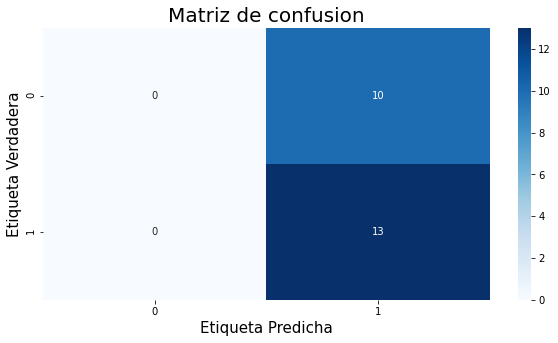

In [132]:
cm = confusion_matrix(y_2, y_test_pred)   
fig,ax = plt.subplots(figsize = (10,5))
sns.heatmap(cm, annot=True, cmap="Blues")   
plt.title('Matriz de confusion', fontsize=20)
plt.xlabel('Etiqueta Predicha', fontsize=15) 
plt.ylabel('Etiqueta Verdadera', fontsize=15)
plt.show() 

*En la matriz de confusion podemos determinar los casos que realmente acierta o no, y que clasifica como 1 que son 0, o los que son 0 y clasifico como 1.*
*Es posible observar que para el valor verdadero TP no tenemos ningun valor y que todos los clasifico como 1 incorrectamente.*
*Asi mismo, en los verdaderos negativos TN, observamos que clasifico la mitad de los datos como 1 de manera correcta, pero que evidentemente hay un problema con nuestro modelo*

In [133]:
# Reporte de clasificacion
print(classification_report(y_2,y_test_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.57      1.00      0.72        13

    accuracy                           0.57        23
   macro avg       0.28      0.50      0.36        23
weighted avg       0.32      0.57      0.41        23



c:\users\pulzara\miniconda3\envs\sp3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\users\pulzara\miniconda3\envs\sp3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\users\pulzara\miniconda3\envs\sp3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



*Podemos observar el Recall: Que es la cantidad de casos clasificados como verdaderos positivos sobre todo lo que realmente era positivo. Siendo el valor maximo 1, que clasifico correctamente los valores correctamente.*

*Podemos observar en el reporte de clasificacion un recall para el valor de 1 = 1.00, indicandome que la clasificacion para los paises que hicierno cuarentena estricta fue buena. Sin embargo en la clasificacion de cero, podemos observar lo visto en la matriz de confusion, donde no pudo detemrinar correctamente los valores de cero.*

*Creamos la funcion sigmoide*

In [135]:
def sigmoid_function(x,w0, w1):
    '''Equivalente a perceptron con funcion de activacion sigmoide'''    
    z = w0 + w1*x #notar que es una funcion lineal
    y = 1/(1 + np.exp(-z))   #notar que es una composicion
    return y

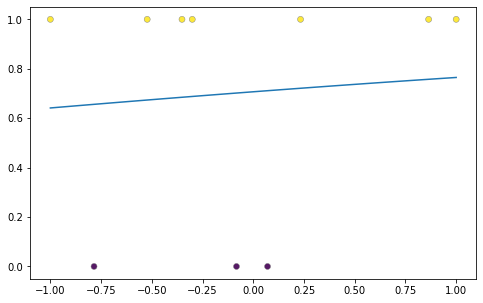

In [136]:
plt.figure(figsize=(8,5))
plt.scatter(X, y, c = y, alpha = 0.9, lw = 0.5, edgecolor = 'grey') 
#x_plot = np.linspace(-100,100) 
x_plot = np.linspace(-1,1)
plt.plot(x_plot, sigmoid_function(x_plot,clf.intercept_[0], clf.coef_[0][0]))

*Se puede observar que apesar de un buen accuracy, la sigmoide no tiende a separar bien los datos. Hay una pendiente inclinada que trata de adaptarse a los datos. Sin embargo el volumen de entrada no es el adecuado para entender cual es el comportamiento que mas se ajusta.*

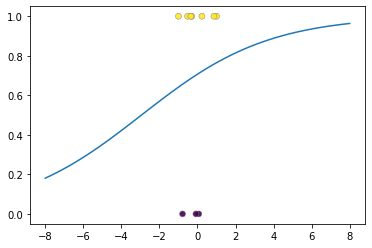

In [137]:
plt.scatter(X, y, c = y, alpha = 0.9, lw = 0.5, edgecolor = 'grey')
x_plot = np.linspace(-8,8) 
#x_plot = np.linspace(0.1,0.5)
plt.plot(x_plot, sigmoid_function(x_plot,clf.intercept_[0], clf.coef_[0][0]))

*Podemos observar que si amplio el rango de mi eje x, observaremos la sigmoide un poco mejor. Sin embargo, esto no es lo que realmente quiero obtener. La falta de informacion y la dependencia de muchas variables que no se tienen en cuenta, pueden estar afectando el resultado.*

### Modelo segundo indicador

**Cantidad de casos totales**

In [138]:
X = np.array(frame.valor_medio_casos_totales).reshape(-1,1)
y = frame.cuarentena

In [139]:
Dx = np.array(D.valor_medio).reshape(-1,1)  
y_2 = D.cuarentena 

Realizaremos un MinMaxScaler entre -1 y 1 para normalizar los datos

In [140]:
sc = MinMaxScaler(feature_range=(-1, 1))
X = sc.fit_transform(X)
Dx = sc.fit_transform(Dx) 

In [141]:
clf = LogisticRegression().fit(X,y)   
y_train_pred = clf.predict(X)
y_test_pred = clf.predict(Dx)
print(metrics.accuracy_score(y, y_train_pred))
print(metrics.accuracy_score(y_2, y_test_pred)) 

0.8
0.4782608695652174


*Para el indicador dos (casos totales), obtenemos la cantidad de veces que acerto en entrenamiento, accuracy = 0.8*. *Por otro lado, en el entrenamiento, este valor cae significativamente a 0.47.*

In [142]:
print(clf.coef_, clf.intercept_)

[[-0.88731681]] [0.28372901]


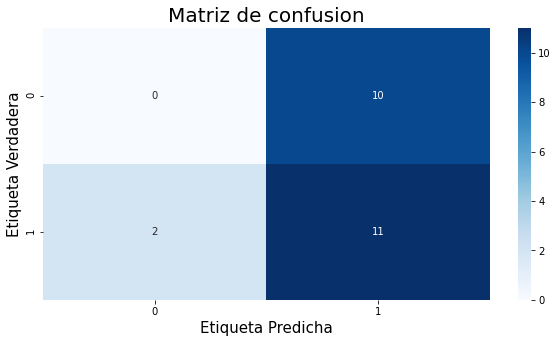

In [143]:
cm = confusion_matrix(y_2, y_test_pred)   
fig,ax = plt.subplots(figsize = (10,5))
sns.heatmap(cm, annot=True, cmap="Blues")   
plt.title('Matriz de confusion', fontsize=20)
plt.xlabel('Etiqueta Predicha', fontsize=15)
plt.ylabel('Etiqueta Verdadera', fontsize=15)
plt.show() 

*Podemos ver en los TP que no predijo cero correctamente. por el contrario pasaron a ser falsos negativos, a predecir como 1 los que teninan que ser cero.* *Tambien, para este indicador, vemos que hay dos nuevos datos de falso positivos, es decir casos que son 1 pero se predijeron como 0, y los casos que son 1 ahora bajaron en cantidad.* 

In [144]:
# Reporte de clasificacion
print(classification_report(y_2,y_test_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.52      0.85      0.65        13

    accuracy                           0.48        23
   macro avg       0.26      0.42      0.32        23
weighted avg       0.30      0.48      0.37        23



*El recall nuevamente me confirma lo visto en la matriz de confusion, donde solo los verdaderos positivos que realmente son positivos, estan clasificados en 1, pero en 0 no determino ningun valor de recall.*

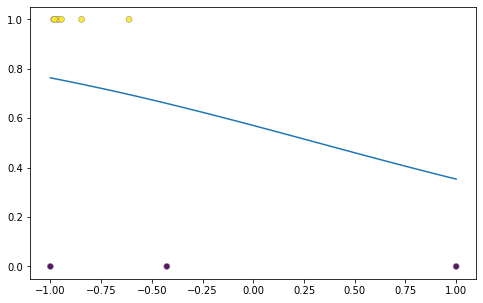

In [145]:
plt.figure(figsize=(8,5))
plt.scatter(X, y, c = y, alpha = 0.9, lw = 0.5, edgecolor = 'grey') 
#x_plot = np.linspace(-100,100) 
x_plot = np.linspace(-1,1)
plt.plot(x_plot, sigmoid_function(x_plot,clf.intercept_[0], clf.coef_[0][0]))

*Podemos observar que la clasificacion de los datos no es muy clara, pero si se puede ver la tendencia que siga la sigmoide. Por debajo de 0 en x se considera como 1 y por encima de 0 en x se consiera como 0. Esto tiene sentido si el valor medio de casos totales disminuye, se podria pensar que se debe a la cuarentena mas estricta*

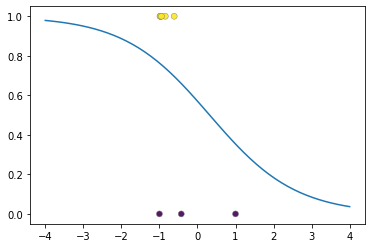

In [146]:
plt.scatter(X, y, c = y, alpha = 0.9, lw = 0.5, edgecolor = 'grey')
x_plot = np.linspace(-4,4) 
#x_plot = np.linspace(0.1,0.5)
plt.plot(x_plot, sigmoid_function(x_plot,clf.intercept_[0], clf.coef_[0][0]))

*Si ampliamos el rango de x, observamos nuevamente el comportamiento de la sigmoide. Pero no es lo que esperamos para nuestro modelo por que se aleja mucho de los datos de entrenamiento*

### Modelo tercer indicador
**error valor medio de muertes totales**

In [147]:
X = np.array(frame.error_valor_medio_muertes).reshape(-1,1)
y = frame.cuarentena

In [148]:
Dx = np.array(D.error).reshape(-1,1)  
y_2 = D.cuarentena 

Realizaremos un MinMaxScaler entre -1 y 1 para normalizar los datos

In [149]:
sc = MinMaxScaler(feature_range=(-1, 1))
X = sc.fit_transform(X)
Dx = sc.fit_transform(Dx) 

In [150]:
clf = LogisticRegression().fit(X,y)   
y_train_pred = clf.predict(X)
y_test_pred = clf.predict(Dx)
print(metrics.accuracy_score(y, y_train_pred))
print(metrics.accuracy_score(y_2, y_test_pred)) 

0.7
0.5652173913043478


*Obtenemos un accuracy de 70 % en el tercer indicador (error valor medio de muertes totales), y un 56% en la clasificacion de testeo de veces acertadas sobre el total de entrada.*

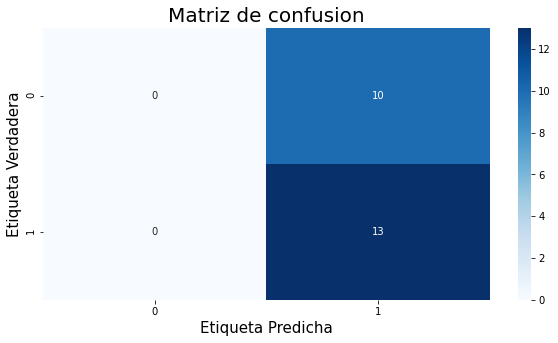

In [151]:
cm = confusion_matrix(y_2, y_test_pred)   
fig,ax = plt.subplots(figsize = (10,5))
sns.heatmap(cm, annot=True, cmap="Blues")   
plt.title('Matriz de confusion', fontsize=20)
plt.xlabel('Etiqueta Predicha', fontsize=15)
plt.ylabel('Etiqueta Verdadera', fontsize=15)
plt.show() 

*Podemos determinar nuevamente el la clasificacion de nuestro modelo, que no es tan bueno cuando trata de predecir los ceros. En este caso, para los verdaderos negativos se ha clasificado 13 datos correctamente, mientras que en los verdaderos positivos, se han clasificado todos como 1 pero son realemente cero.* *Este modelo, tiene el mismo problema que el primer indicador, cuando quiere predecir los valores de cero.*

In [152]:
# Reporte de clasificacion
print(classification_report(y_2,y_test_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.57      1.00      0.72        13

    accuracy                           0.57        23
   macro avg       0.28      0.50      0.36        23
weighted avg       0.32      0.57      0.41        23



c:\users\pulzara\miniconda3\envs\sp3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\users\pulzara\miniconda3\envs\sp3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\users\pulzara\miniconda3\envs\sp3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



*Confirmando lo anterior para el recall donde 1 es igual a 1.00, y 0 es igual a 0.00, nuevamente podemos decir que la cantidad de casos clasificados como verdaderos positivos sobre todo que realmente era positivo es cero. Es decir que estan mal clasificados.* 

In [153]:
print(clf.coef_, clf.intercept_)

[[0.06093374]] [0.88320438]


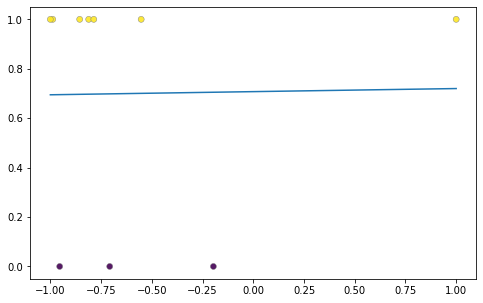

In [154]:
plt.figure(figsize=(8,5))
plt.scatter(X, y, c = y, alpha = 0.9, lw = 0.5, edgecolor = 'grey')
#x_plot = np.linspace(-100,100) 
x_plot = np.linspace(-1,1)
plt.plot(x_plot, sigmoid_function(x_plot,clf.intercept_[0], clf.coef_[0][0]))

*Podemos definir el valor 0 para la clasificacion. A mayor valor del error del valor medio de muertes totales, la cuarentena estricta tiene que ser alta, ya que mucha gente estaria muriendo en esos paises. Para frenar ese crecimiento, se aplicaria la politica de cuarentena obligatoria con un nivel mas alto.* 

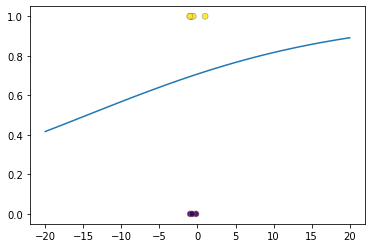

In [155]:
plt.scatter(X, y, c = y, alpha = 0.9, lw = 0.5, edgecolor = 'grey')
x_plot = np.linspace(-20,20) 
#x_plot = np.linspace(0.1,0.5)
plt.plot(x_plot, sigmoid_function(x_plot,clf.intercept_[0], clf.coef_[0][0]))

*Vemos que para valores ams grandes la sigmoide toma la forma que es. Por esta misma razon, el modelo no va a ser nada util para interpretar las consecuencias o las muertes relaes que podrian llegar a pasar.*

### Resultados Modelos 

Despues de calcular el accuracy para los modelos, fue posible determinar que el mejor indicador con un accuracy mas alto son el indicador 1 y el indicador 2. El valor para ambos fue de accuracy =  0.7
en el entreamiento y de accuracy = 0.5652173913043478 en el testeo. Sin embargo, estos modelos no son tan buenos para poder predecir y asegurar algun dato sobre la cuarentena estricta, y predecir correctamente la clasificacion.

Para tratar de solucionar el problema, implementaremos otros modelos mas para ver su comportamiento y que tan bien predicen con nuestros datos de entrada. 




## Modelo radom forest

*Vamos a realizar un modelo de random forest para el **numero de casos totales**, y determinar si hay alguna mejora en comparacion con la regresion logistica*

In [222]:
X = np.array(frame.valor_medio_casos_totales).reshape(-1,1)
y = frame.cuarentena

Dx = np.array(D.valor_medio).reshape(-1,1)  
y_2 = D.cuarentena 

In [223]:
clf = RandomForestClassifier(n_estimators=100, max_features='sqrt', oob_score = True, random_state = 42)
clf.fit(X,y)

RandomForestClassifier(max_features='sqrt', oob_score=True, random_state=42)

In [224]:
y_train_pred = clf.predict(X)
y_test_pred = clf.predict(Dx)
print(metrics.accuracy_score(y, y_train_pred))
print(metrics.accuracy_score(y_2, y_test_pred))  

1.0
0.6086956521739131


*Podemos determinar que el modelo en el train esta entrenando muy bien y que los valores que acerto sobre los datos de entrada es alto = 1. Sin embargo, con los datos de test, el accuracy score incrementa hasta = 0.608, indicandome un mejor modelo para la clasificacion binaria. Por otro lado,  Hay muchos factores que no se estan tomando en cuenta.*  

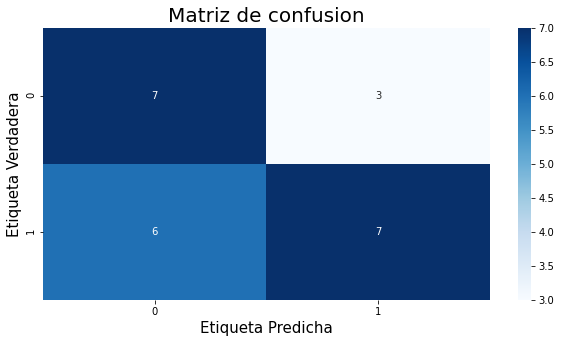

In [225]:
cm = confusion_matrix(y_2, y_test_pred)   
fig,ax = plt.subplots(figsize = (10,5))
sns.heatmap(cm, annot=True, cmap="Blues")   
plt.title('Matriz de confusion', fontsize=20)
plt.xlabel('Etiqueta Predicha', fontsize=15)
plt.ylabel('Etiqueta Verdadera', fontsize=15)
plt.show() 

*La matriz de confusion en este caso, esta un poco indecisa para los falsos positivos, pero para los verdaderos positivos = 7, ya existe una mejor clasificacion y solo hay 3 falsos negativos.* 

In [226]:
# Reporte de clasificacion
print(classification_report(y_2,y_test_pred))

              precision    recall  f1-score   support

           0       0.54      0.70      0.61        10
           1       0.70      0.54      0.61        13

    accuracy                           0.61        23
   macro avg       0.62      0.62      0.61        23
weighted avg       0.63      0.61      0.61        23



*El recall ahora para 0 aumento hasta 0.70 y para 1 dimsinuyo a 0.54, sin embargo parece ser un mejor modelo para la clasificacion de verdaderos positivos sobre todo lo que realmente es positivo. siendo 1 los paises con mayor cuarentena estricta y 0 los paises con menos cuarentena estricta, haciendo uso del primer indicador de valor medio de casos totales* 

## Modelo bayes
*Vamos a realizar un **modelo de bayes** para el numero de casos totales, y determinar si hay alguna mejora en comparacion con la regresion logistica*

Este teorema es la base del razonamiento deductivo, que se centra en determinar la probabilidad de que ocurra un evento basándose en el conocimiento previo de las condiciones que podrían estar relacionadas con el evento. Naive Bayes es un algoritmo simple y fácil de implementar. Debido a esto, podría superar a modelos más complejos cuando la cantidad de datos es limitada.
En este caso queremos determinar la probabilidad de que el suceso - (es cuarenta alta o cuarentena menos alta - ocurra. 
Para esto usaremos scikit-learn.

In [187]:
X = np.array(frame.valor_medio_casos_totales).reshape(-1,1)
y = frame.cuarentena

Dx = np.array(D.valor_medio).reshape(-1,1)  
y_2 = D.cuarentena 
#Realizaremos un MinMaxScaler entre -1 y 1 para normalizar los datos

sc = MinMaxScaler(feature_range=(-1, 1))
X = sc.fit_transform(X)
Dx = sc.fit_transform(Dx) 

clf = GaussianNB().fit(X,y)     

In [188]:
y_train_pred = clf.predict(X)
y_test_pred = clf.predict(Dx)
print(metrics.accuracy_score(y, y_train_pred))
print(metrics.accuracy_score(y_2, y_test_pred))  

0.9
0.5217391304347826


*El accuracy para el modelo de bayes en el entrenamiento es = 0.9, indicando que se acerto la afirmacion, sobre el total de entrada, pero al realizar la prediccion en el testeo, baja hasta 0.521.* 

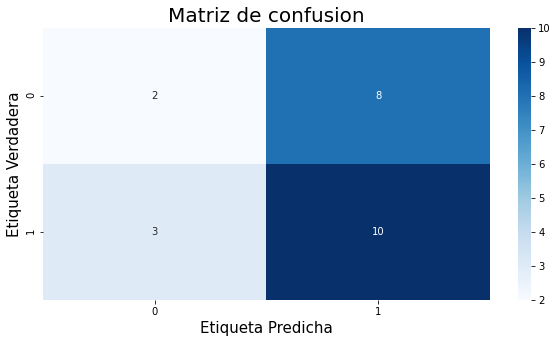

In [189]:
cm = confusion_matrix(y_2, y_test_pred)  
fig,ax = plt.subplots(figsize = (10,5))
sns.heatmap(cm, annot=True, cmap="Blues")   
plt.title('Matriz de confusion', fontsize=20)
plt.xlabel('Etiqueta Predicha', fontsize=15)
plt.ylabel('Etiqueta Verdadera', fontsize=15)
plt.show() 

La matriz de confusion me muestra para este caso que la cantidad de verdaderos negativos es igual a 13, y que los verdaderos positivos ahora son 2 y se predijeron 8 como 1 que deberian ser 0. La dieferencia de este modelo bayes y de clasificacion, es que disminuyo en la clasificacion de verdadero positivo para 0 pero nuevamente aumento para verdadero negativo (1).

In [164]:
# Reporte de clasificacion
print(classification_report(y_2,y_test_pred))

              precision    recall  f1-score   support

           0       0.40      0.20      0.27        10
           1       0.56      0.77      0.65        13

    accuracy                           0.52        23
   macro avg       0.48      0.48      0.46        23
weighted avg       0.49      0.52      0.48        23



*Se determina que el recall o casos clasificados como verdaderos sobre todo lo que realmente es positivo no sobre pasa el valor de 0.6, lo cual lo vuelve poco confiable.*

# Otros modelos

**vamos a probar otros modelos para determinar su accuracy de manera muy superficial para observar su comportamiento, no entraremos en detalle para este caso** 

In [204]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier


In [218]:
X = np.array(frame.valor_medio_casos_totales).reshape(-1,1)
y = frame.cuarentena

Dx = np.array(D.valor_medio).reshape(-1,1)  
y_2 = D.cuarentena 
#Realizaremos un MinMaxScaler entre -1 y 1 para normalizar los datos

sc = MinMaxScaler(feature_range=(-1, 1))
X = sc.fit_transform(X)
Dx = sc.fit_transform(Dx)

In [219]:
knn = KNeighborsClassifier()
knn_model = knn.fit(X, y)


gbm_model = GradientBoostingClassifier().fit(X, y)

loj = LogisticRegression(solver = "liblinear")
loj_model = loj.fit(X,y)

nb = GaussianNB()
nb_model = nb.fit(X, y)

mlpc = MLPClassifier(random_state=1, max_iter=20000, solver='lbfgs').fit(X, y)  

rf = RandomForestClassifier(n_estimators=100, max_features='sqrt', oob_score = True, random_state = 42)
rf.fit(X,y)

RandomForestClassifier(max_features='sqrt', oob_score=True, random_state=42)

In [220]:
models = [
    knn_model,
    loj_model,
    nb_model,
    mlpc,
    gbm_model, 
    rf
      
]

for model in models:
    names = model.__class__.__name__
    y_pred = model.predict(Dx)
    accuracy = accuracy_score(y_2, y_pred)
    print("-"*28)
    print(names + ":" )
    print("Accuracy: {:.4%}".format(accuracy))

----------------------------
KNeighborsClassifier:
Accuracy: 56.5217%
----------------------------
LogisticRegression:
Accuracy: 47.8261%
----------------------------
GaussianNB:
Accuracy: 52.1739%
----------------------------
MLPClassifier:
Accuracy: 47.8261%
----------------------------
GradientBoostingClassifier:
Accuracy: 47.8261%
----------------------------
RandomForestClassifier:
Accuracy: 47.8261%


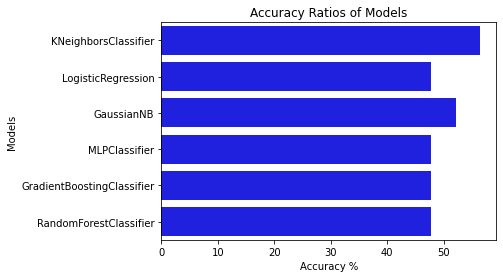

In [221]:
result = []

results = pd.DataFrame(columns= ["Models","Accuracy"])

for model in models:
    names = model.__class__.__name__
    y_pred = model.predict(Dx)
    accuracy = accuracy_score(y_2, y_pred)    
    result = pd.DataFrame([[names, accuracy*100]], columns= ["Models","Accuracy"])
    results = results.append(result)
    
    
sns.barplot(x= 'Accuracy', y = 'Models', data=results, color="b")
plt.xlabel('Accuracy %')
plt.title('Accuracy Ratios of Models'); 

*Concluimos que el modelo con mayor accuracy es KNC.*

# Informe

Este proyecto se basa en el estudio de la pandemia que se inicio en el año 2020 en el mes de enero hasta el año 2021. El proposito es determinar algunos factores importantes que son influyentes a la hora de tomar deciciones, y poder salvar vidas si es necesario. El dataset que se uso para este informe se obtuvo a traves de https://ourworldindata.org/coronavirus-data?country=, usando datos reales de la pandemia. 
Este dataset cuenta con 126456 filas × 65 columnas, con atributos relacionados a los casos confirmados, muertes confirmadas, mortalidad, hospitales ICU, politica de respuesta, tasa de reproduccion, test de coronavirus positivos, vacunacion, localidad, continente, PIB, personas fumadoras,..,etc. 

Para la primera parte de la investigacion, con el fin de obtener el conocido valor k, que se puede estimar a partir de la ecuacion de casos confirmados que dependen del tiempo. Este valor k, es el parametro que mide la diferencia de a cuánta gente contagia una persona infectada. $t_0$ es la fecha inicial de contagio:

$C(t)=e^{k(t-t_0)}$     [casos confirmados] 

## 1. Valor k

La primera parte de la investigacion, se enfocara en determinar el valor k para diferentes paises de todo el mundo. Es necesario realizar un ajuste exponencial en las curvas de cada pais, para obtener los parametros y coeficientes de la ecuacion de casos confirmados. Los datos seran tratados y explorados conforme sea necesario, ademas de eliminar datos nulos y de determinar que columnas aportar informacion relevante.Empezaremos por los paises del norte los cuales incluyen su valor correspondiente de k:

| Country | valor k | 
| --- | --- | 
| Argentina | 0.090274 | 
| Germany | 0.075216| 
| Austria| 0.229611|  
| Canadá| 0.321762|  
| Colombia| 0.367804| 
| España| 0.208232| 
| Italia | 0.208232| 
| Japón | 0.080686|  
| Panamá| 0.125167| 
| Rusia | 0.106757| 
| Guatemala | 0.099032|  



Para determinar una valor k de manera global, usando estos paises se calculo el intervalo de confianza, usando bootstrap, donde se obtuvieron los siguientes parametros:

| media del valor_de_k | Intervalo de confianza | 
| --- | --- | 
| 0.144528 | 95% = [0.080686 - 0.30141825] | 


Apartir de esto podemos determinar que el mayor numero K, es decir, la diferencia de cuanta gente contagia una persona infectada, se encuentra en Canada y Colombia, y es menor para paises que se encuentran en Europa, Japon, Argentina. Sin embargo, es importante aclarar que la cantidad de dias usados para cada pais, varia segun su comportamiento en la curva exponencial, para asi poder realizar un ajuste que tenga sentido e interpretabilidad, donde en algunos ocaciones, eran mas dias que en otros, pero la parte mas representativa es la que se tomo en cuenta.

## 2. Graficas que aporten valor

Para empezar el análisis, primero se determinaron algunos criterios para el proyecto. Es necesario realizar comparaciones, con países que tengan algo en común, algún tipo de comportamiento característico como el gdp per capita. A partir de esto podemos seleccionar 5 países de Latinoamérica y 5 países que son potencias mundiales. 
Seleccionamos 5 países: 
1.	Colombia
2.	Dominican Republic
3.	Ecuador
4.	Brasil
5.	Perú
Seleccionamos 5 países:
1.	Austria
2.	Germany
3.	United states
4.	Iceland
5.	Netherlands

Análisis Países de Latinoamérica:

En la grafica de curva de tendencia de casos totales de coronavirus vs fecha, Brasil tiene un comportamiento exponencial mayor a el resto de los países. República dominicana y Ecuador, tiene unos valores de casos totales muy inferiores, esto posiblemente se deba la cantidad de población de cada país. Sin embargo, omitiendo este factor, el crecimiento de casos sigue siendo más rápido en Brasil y en Colombia. Aquí podemos observar un poco la diferencia entre cultura y autocuidado que existe dentro de Latinoamérica, aunque esto es una especulación. Por otro lado, si observamos el comportamiento de cada país, se observa que la tendencia de la curva es en forma de m, donde hay aumentos y después de un periodo de tiempo trata de volverse constante, pero poco después vuelve y aumentan los números de casos. Esto posiblemente se deba a las restricciones y a la cuarentena que se realizaron para prevenir los contagios. Para Brasil y Ecuador, este comportamiento no esta presente.

En la gráfica curva de tendencia de muertes totales por coronavirus, Brasil nuevamente es el mayor país con estos casos (610 K). Se puede observar un comportamiento creciente, sin embargo, no es de una función exponencial. Hay partes de la curva que tiende a estabilizarse, además, por obvias razones, no lo consigue y las muertes aumentan en función del tiempo. Los demás países de Latinoamérica se comportan de una manera parecida. El país con menos muertes es república dominicana (4.1 k). 

En la gráfica de personas vacunadas vs fecha, es posible interpretar lo siguiente. En los países como Colombia, la vacuna llego mucho tiempo después, así como en Ecuador, por tal razón, la curva de vacunados empieza en un tiempo mucho mayor que en Brasil. Todo esto viene relacionado con el gobierno de cada país y sus decisiones acertada o no acertadas con el pueblo.

Por último, tenemos la gráfica de la política pública (stringency_index) vs fecha. Este valor va desde 0-100 siendo 0 un valor bajo de restricción y 100 un valor alto de restricción. Es posible determinar que el valor aumenta y disminuye dependiendo de los picos de contagios. No obstante, los países coinciden en el periodo de tiempo en el que aumenta este valor de política pública.


Análisis Países Potencias Mundiales: 
En la gráfica de curva de tendencia de casos totales de coronavirus vs fecha, Estados Unidos presente el mayor valor de casos en todo el periodo de tiempo. Se puede observar que hay una gran diferencia en cuanto al área bajo la curva. El segundo país con mas casos de coronavirus es Rusia. El menor país con casos totales es Iceland, Netherland, lo cual se deba a la cantidad de la población. Si analizamos cada grafica se observa lo siguiente: para Austria el comportamiento es un poco brusco, ya que hay un aumento demasiado rápido de casos que no disminuye pronto, sino que coge mas fuerza a medida que pasa el tiempo. En Rusia, los casos aumentan con una proporción no tan brusca, sino que por periodos trata de permanecer constante, pero después sigue aumentando. En Estados Unidos, vemos efectivamente lo que esperábamos según lo que se sabía de las políticas y pensamientos del presidente, y es que los aumentos fueron incrementando rápidamente a un punto critico de casos, y que al tiempo después trata de estabilizarse, pero nuevamente se repite el aumento. En Iceland, vemos algo muy diferente que, al resto de países, donde no hay un aumento exponencial, sino, que se observa un aumento lineal para un cierto periodo de tiempo, como si ellos determinaran cuando contagiarse. Posteriormente después de ese incremento, hay una tendencia constante con una pendiente que se acerca a cero. Increíblemente permanece así por un largo periodo de tiempo y después en julio del 2021 hay un aumento nuevamente que parece cambiar de función. En Netherland, hay unos pocos casos al principio de la pandemia, hasta septiembre del 2020, donde hay un aumento exponencial que no se estabiliza en ningún punto.

En la grafica de tendencia de muertes totales de coronavirus, por análisis previo se esperaba que Estados Unidos lidere el nivel más alto de casos (740K), el cual no disminuye en ningún punto. El segundo país con muertes totales rusia (230 K), pero su comportamiento es diferente, siendo mas estable en un periodo de tiempo mas largo hasta 2021, donde empiezan a aumentar las muertes de manera mas fuerte. Las muertes totales de los demás países permanecen constantes durante todo el periodo de tiempo, con un valor muy similar entre ellos, posiblemente sea por el pensamiento o la cultura que tienen en común (valores < 19K). 
En la gráfica de personas vacunadas vs fecha, es posible interpretar lo siguiente. En Estados Unidos, como potencia mundial, la vacuna se pudo implementar más rápidamente, por lo que muchos ciudadanos, empezaron a vacunarse, sin embargo, la vacuna no es totalmente eficiente, así que esto viene relacionado con la cantidad de muertes. La cual podría ser ocasionada por descuidos de las personas ya vacunadas, que pensaban que no podían enfermarse de nuevo. Por otro lado, en el resto de los países hay menos personas vacunadas, y en comparación entre Rusia y Estados unidos, son menos las personas muertas, teniendo en cuenta que tienen la cantidad de población que es muy parecida. Con esto se podría pensar que la vacuna en realidad no esta surtiendo efecto en las personas, hay otros factores que influyen. 
Por último, tenemos la gráfica de la política pública (stringency_index) vs fecha. Este valor va desde 0-100 siendo 0 un valor bajo de restricción y 100 un valor alto de restricción. Es posible determinar que el valor aumenta y disminuye dependiendo de los picos de contagios. Para este caso, es posible determinar que cada país, tomo medidas diferentes en tiempos diferentes, donde hay aumento de stringency_index mientras que en otros países había una disminución.

## 3. Indicadores

Como se comento anteriormente, hay una política pública que se encarga de darle un valor numérico a los países que aplicaron cuarentena más estricta (stringency_index). A partir de esto, escogemos 3 indicadores, y armamos una clasificación (0-1). 
Primer indicador: El valor k. Se obtuvo a partir de los datos un análisis sobre los números de casos vs días, realizando un ajuste en la tendencia de la curva y encontrando nuevamente el valor_k para los países de Latinoamérica y los países que son potencias mundiales. Para empezar con la investigación, se determinó el periodo de tiempo:  
a. El periodo de tiempo de analisis que va desde 2020-03-01 hasta 2020-03-17, cuando empieza a crecer el valor de la cuarentena estricta.
Para realizar la comparación, se determino el valor de k para los países de Latinoamérica y los países potencias mundiales dentro del mismo periodo de tiempo. Posteriormente se obtuvo la media del valor k con su respectivo intervalo de confianza, usando Bootstrap, y así obtener una comparación que se podría ver como un contraste en las políticas de Latinoamérica y las políticas de los países del primer mundo.

| países | Valor k | Intervalo de confianza| 
| --- | --- | -- |
| Latinoamérica | 0.2954102 | 95% = [0.1604631 - 0.408588] |
| Potencias mundiales | 0.263640 | 95% = [0.1879026 - 0.311098 ] |


Segundo indicador: Se calculo como seria el comportamiento sin cuarentena durante este tiempo y obtenemos el error relativo de la media teórica con la experimental. Para el segundo periodo de tiempo donde se aplica la policita publica, se quiere predecir el comportamiento de la curva sin cuarentena estricta y con cuarentena estricta, y a partir de la media obtener la diferencia entre ambas y conocer el porcentaje de error. Aqui simplemente se mostrarán los valores medios de cada país. 

| Country | valor medio | 
| --- | --- | 
| Colombia | 23534.510 | 
| Republica Dominicana | 12054.558| 
| Ecuador| 27445.404|  
| Brazil| 371516.433|  
| Perú| 100901.750| 
| Austria| 14680.173| 
| Russia | 251432.231| 
| United States| 1290370.596| 
| Iceland | 1649.154| 
| Netherlands| 36655.279| 

Como se puede observar esto corresponde a la media de casos totales de muertes para el segundo periodo de tiempo. Siendo Estados unidos el que obtiene el mayor número de casos, seguido de Brasil. 


Tercer indicador: Dentro de los dos primeros rangos de tiempos anteriores, se determino la media de cuantas personas murieron por COVID 19.  Aquí los resultados de los análisis:
**Sin aplicar política publica**

* El promedio de personas muertas por billón en países de sur América, en cuarentena estricta es 0.094 billones.
* El promedio de personas muertas por billón en países potencias mundiales, en cuarentena estricta es 0.303 billones.

Podemos observar que el promedio de la media de muertes durante la cuarentena no estricta es mayor en los países potencias con un 0.2623 billones. Mientras que en los países de Suramérica fue de un 0.935 billones. Sin embargo, hay valores que faltan para ambas tablas, que se puede dar debido a que la pandemia llego primero a los países europeos y estados unidos, que en Latinoamérica. Por lo tanto, el nivel de contagio creció de una manera más rápida e inesperada. Por otro lado, se puede deber también a que no se reportan los casos reales de muertes, o un error cuando se crearon las bases de datos.
**Aplicando la política publica** 

* El promedio de personas muertas por billón en países de sur América, en cuarentena estricta es 4.898 billones.
* El promedio de personas muertas por billón en países de sur América, en cuarentena estricta es 26.995 billones.

Podemos observar la diferencia de la media de muertes, en dos periodos de tiempo diferentes. Si bien la política no redujo la cantidad de muertes, este no se le atribuye a la ineficiencia de la política, sino a que las personas que fueron infectadas antes de entrar en cuarentena se vieron afectados días después del contagio, ya que este puede tardar 15 días en presentar los síntomas. La mayor diferencia la observamos en Perú.
Tabla promedio de valores medios de casos de muertes

| Country | valor medio sin política (billón)| valor medio con política (billón) |
| --- | --- | --- | 
| Países Suramérica | 0.3032 |26.994500 |
| Países potencias mundiales | 0.093556 |4.898455 | 

Por otro lado, se añadió dos indicadores mas uno de ellos será necesario para entrenar los modelos de machine learning. El cuarto indicador, determina la media de cuantas personas se infectaron, sin cumplir y cumpliendo la política.

* El promedio de personas infectadas en países de sur América, en cuarentena no estricta es de 29.17333. 
* El promedio de personas muertas por millón en países potencias mundiales, en cuarentena no estricta es 486.10588.
* El promedio de personas infectadas en países de sur América, en cuarentena estricta es de 3436.536.
* El promedio de personas muertas por millón en países de sur América, en cuarentena estricta es 57642.408.

Para los países potencias se puede observar que la cantidad de contagios con restricción siguió aumentando. Esto puede considerarse algo normal ya que muchas personas no eran conscientes de que tan grabe era el virus, que los llevo a no tener los cuidados necesarios. Las personas que se contagiaron antes del lockdown seguramente cuando se encerraron contagiaron a ms personas de su núcleo familiar, y así pudo esparcirse el virus.
El quinto indicador es stringency_index, el cual será usado para determinar que tan estricto fue el país en la cuarentena en un determinado periodo de tiempo. Si es > 75 = 1, si es < 75 = 0.

## 4. Modelo de regresión logística 

Para realizar los modelos de clasificación, usando los indicadores, se creó un nuevo Dataframe con todos los parámetros obtenidos durante el proyecto. Además, se volvieron a calcular los indicadores para ser usados como datos de testeo., con nuevos países.  
1. En el primer indicador (valor k), realizando un MinMaxScaler para rescalar nuestros datos y ser entrenados, se obtuvo finalmente un accuracy = 0.7, donde este valor mide el porcentaje de casos que el modelo ha acertado. Sin embargo, no es recomendable usarlo ya que puede llegar al engaño. En este caso pareciera un buen modelo, pero no lo es. Tenemos un 70% donde el modelo acierta. Posiblemente por el desbalance de los datos de test y train, y por qué no son muchos datos, podemos llegar al sobreajuste. El accuracy = 0.56 afirma que el modelo no está prediciendo muy bien los datos de testeo, y baja significativamente su valor. En la matriz de confusión podemos determinar los casos que realmente acierta o no, y que clasifica como 1 que son 0, o los que son 0 y clasifico como 1. Es posible observar que para el valor verdadero TP no tenemos ningun valor y que todos los clasifico como 1 incorrectamente. Asi mismo, en los verdaderos negativos TN, observamos que clasifico la mitad de los datos como 1 de manera correcta, pero que evidentemente hay un problema con nuestro modelo.  Podemos observar el Recall: Que es la cantidad de casos clasificados como verdaderos positivos sobre todo lo que realmente era positivo. Siendo el valor maximo 1, que clasifico los valores correctamente. Podemos observar en el reporte de clasificación un recall para el valor de 1 = 1.00, indicando que la clasificación para los países que hicieron cuarentena estricta fue buena. Sin embargo, en la clasificación de cero, podemos confirmar lo visto en la matriz de confusión, donde no se pudo determinar correctamente los valores de cero.


2. Segundo indicador (cantidad de casos totales), realizando un MinMaxScaler, obtenemos la cantidad de veces que acertó en entrenamiento, accuracy = 0.8. Por otro lado, en el entrenamiento, este valor cae significativamente a 0.4782. En la matriz de confusión, fue posible ver en los TP que no predijo cero correctamente. Por el contrario, pasaron a ser falsos negativos, a predecir como 1 los que tenían que ser cero. También, para este indicador, vemos que hay dos nuevos datos de falso positivos, es decir casos que son 1 pero se predijeron como 0, y los casos que son 1 ahora bajaron en cantidad. El recall nuevamente me confirma lo visto en la matriz de confusión, donde solo los verdaderos positivos que realmente son positivos, están clasificados en 1, pero en 0 no determino ningún valor de recall.


3. Tercer indicador (error valor medio de muertes totales), realizando un MinMaxScaler, fue posible obtener un accuracy de 70 % (error valor medio de muertes totales), y un 56% en la clasificacion de testeo de veces acertadas sobre el total de entrada. En la matriz de confusión, fue posible determinar nuevamente la clasificación de nuestro modelo, que no es tan bueno cuando trata de predecir los ceros. En este caso, para los verdaderos negativos se ha clasificado 13 datos correctamente, mientras que en los verdaderos positivos, se han clasificado todos como 1 pero son realmente cero. Este modelo, tiene el mismo problema que el primer indicador, cuando quiere predecir los valores de cero. Confirmando lo anterior para el recall donde 1 es igual a 1.00, y 0 es igual a 0.00, nuevamente podemos decir que la cantidad de casos clasificados como verdaderos positivos sobre todo que realmente era positivo es cero. Es decir que están mal clasificados.

Después de calcular el accuracy para los modelos, fue posible determinar que el mejor indicador con un accuracy más alto son el indicador 1 y el indicador 2. El valor para ambos fue de accuracy = 0.7 en el entrenamiento y de accuracy = 0.5652173913043478 en el testeo. Sin embargo, estos modelos no son tan buenos para poder predecir y asegurar algún dato sobre la cuarentena estricta, y predecir correctamente la clasificación. Para tratar de solucionar el problema, implementaremos otros modelos más para ver su comportamiento y que tan bien predicen con nuestros datos de entrada.


## 5. Random Forest

No se realiza ningún MinMaxScaler, ya que el modelo es robusto a outliers o a valores muy grandes. Fue posible determinar que el modelo en train está entrenando muy bien y que los valores que acertó sobre los datos de entrada son altos = 1. Sin embargo, con los datos de test, el accuracy score incrementa hasta = 0.608, indicando un mejor modelo para la clasificación binaria. Por otro lado, Hay muchos factores que no se están tomando en cuenta. La matriz de confusión en este caso está un poco indecisa para los falsos positivos, pero para los verdaderos positivos = 7 ya existe una mejor clasificación y solo hay 3 falsos negativos. El recall ahora para 0 aumento hasta 0.70 y para 1 disminuyó a 0.54, sin embargo, parece ser un mejor modelo para la clasificación de verdaderos positivos sobre todo lo que realmente es positivo. siendo 1 los países con mayor cuarentena estricta y 0 los países con menos cuarentena estricta, haciendo uso del primer indicador de valor medio de casos totales.

## 6. Modelo Bayes

Este teorema es la base del razonamiento deductivo, que se centra en determinar la probabilidad de que ocurra un evento basándose en el conocimiento previo de las condiciones que podrían estar relacionadas con el evento. Naive Bayes es un algoritmo simple y fácil de implementar. Debido a esto, podría superar a modelos más complejos cuando la cantidad de datos es limitada. En este caso queremos determinar la probabilidad de que el suceso - (es cuarenta alta o cuarentena menos alta - ocurra. Para esto usaremos scikit-learn. Nuevamente se implementó un MinMaxScaler. El accuracy para el modelo de bayes en el entrenamiento es = 0.9, indicando que se acertó la afirmación, sobre el total de entrada, pero al realizar la predicción en el testeo, baja hasta 0.521. La matriz de confusión muestra para este caso que la cantidad de verdaderos negativos es igual a 13, y que los verdaderos positivos ahora son 2 y se predijeron 8 como 1 que deberían ser 0. La diferencia de este modelo bayes y de clasificación, es que disminuyo en la clasificación de verdadero positivo para 0 pero nuevamente aumento para verdadero negativo (1). Se determina que el recall o casos clasificados como verdaderos sobre todo lo que realmente es positivo no sobre pasa el valor de 0.6, lo cual lo vuelve poco confiable. 

## 7. Conclusiones

Se cumplió con los objetivos de estudio de la pandemia y el valor k, junto con otros parámetros como casos totales, casos totales de muertes, haciendo uso de la estadística para calcular valores medios y entender el comportamiento de las curvas, además de calcular ajustes exponenciales con sus respectivos valores e intercepto de la función Euler. Es importante destacar, que los modelos entrenados con los datos no tienen una calidad suficiente para ser confiables, por lo tanto, se deberán usar mas columnas o mas datos para poder entrenar los modelos, ya que cada país depende de un factor diferente en cuanto a la pandemia, y predecir algo de esta magnitud se requiere de un análisis mucho mas profundo, utilizando otra metodología que no sean de comparación entre países. Hay otros modelos estadísticos y matemáticos más avanzados para determinar el factor k, y no solo eso sino, que se tiene en cuenta la susceptibilidad, los infectados y los recuperados, a este modelo se le conoce como SIR y SEIR. Por medio de derivadas es posible conocer los parámetros de beta, gamma y omega que son tasa de infección, tasa de recuperación, tasa de incubación respectivamente. 


